In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from pandas.plotting import scatter_matrix
import missingno as msno
import matplotlib.pyplot as plt

In [2]:
pd.options.display.float_format='{:,.4f}'.format

In [3]:
df = pd.read_csv('/content/ts_kwh_dataframe.csv')
df = df.drop('Unnamed: 0', axis = 1)
df

,Fecha,kW/h price mean,kW/h price std,Disponibilidad_HIDRAULICA,Disponibilidad_TERMICA,Disponibilidad_SOLAR,Aportes Caudal m3/s,Aportes Energía gWh,Volumen Útil Diario Mm3,Volumen Mm3,Volumen Útil Diario Energía gWh,Volumen Energía gWh,Vertimientos Volumen miles m3,Vertimiento Energía gWh
0,2000-01-01,32.8681,2.8577,172.6811,81.6062,nan,719.1000,56.6773,"5,454.0068","6,024.5120","10,732.3505","11,548.8853","16,212.9922",23.8878
1,2000-01-02,33.0348,3.6742,172.5040,79.4192,nan,768.3400,54.6452,"5,421.8808","5,992.3860","10,712.4928","11,529.0276","14,161.0631",20.5843
2,2000-01-03,37.2723,7.7108,172.3862,79.4102,nan,757.5000,57.4883,"5,390.9129","5,961.4181","10,677.3738","11,493.9081","13,370.1628",19.3694
3,2000-01-04,41.6890,8.1507,171.9537,79.4032,nan,739.9300,58.4182,"5,364.3178","5,934.8230","10,643.9801","11,460.5150","13,292.4191",18.7103
4,2000-01-05,40.8931,7.9562,172.3443,79.4032,nan,729.8500,63.0395,"5,345.9628","5,916.4680","10,614.0214","11,430.5566","16,737.6356",21.1667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7861,2021-07-10,85.1562,3.7852,225.1027,106.3479,nan,"2,758.6370",249.8449,"11,739.2200","14,470.6500","14,126.5203","15,678.8082","29,622.3370",60.7249
7862,2021-07-11,83.3529,0.3735,233.0707,106.3245,nan,"3,598.6330",333.1600,"11,824.9198","14,556.3498","14,211.3838","15,763.6715","65,827.5795",66.4647
7863,2021-07-12,84.9800,0.4186,233.1127,106.3820,nan,"2,912.5250",224.1366,"11,839.7830","14,571.2130","14,213.3817","15,765.6696","65,381.5660",53.1992
7864,2021-07-13,83.6892,0.1406,235.5412,106.2828,nan,"3,296.7080",237.2587,"11,873.2230","14,604.6530","14,223.8340","15,776.1216","42,932.2150",34.5093


In [4]:
df.dtypes

Fecha                               object
kW/h price mean                    float64
kW/h price std                     float64
Disponibilidad_HIDRAULICA          float64
Disponibilidad_TERMICA             float64
Disponibilidad_SOLAR               float64
Aportes Caudal m3/s                float64
Aportes Energía gWh                float64
Volumen Útil Diario Mm3            float64
Volumen Mm3                        float64
Volumen Útil Diario Energía gWh    float64
Volumen Energía gWh                float64
Vertimientos Volumen miles m3      float64
Vertimiento Energía gWh            float64
dtype: object

In [5]:
df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.set_index('Fecha')

In [6]:
df['Year'] = df.index.year
df['Month'] = df.index.month

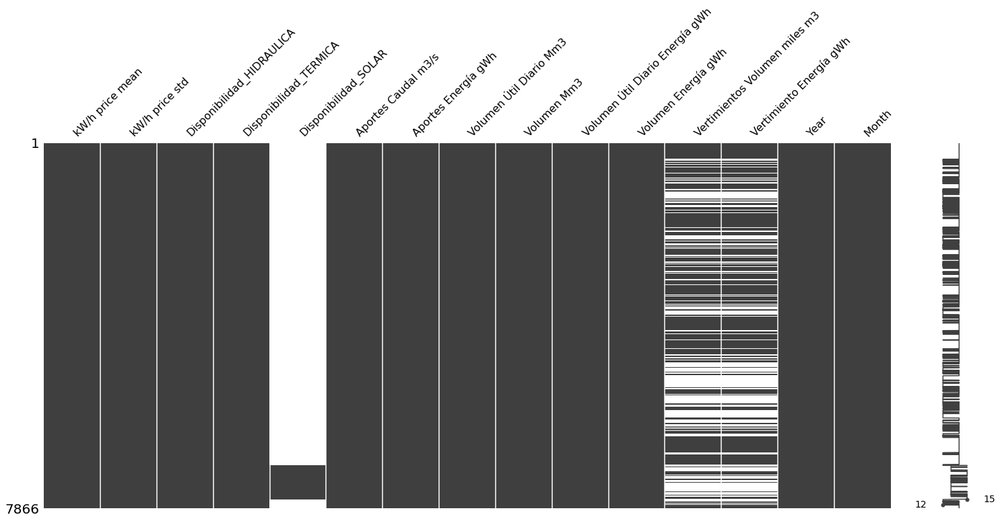

In [7]:
msno.matrix(df)

In [8]:
df[[ 'kW/h price mean', 'kW/h price std',
       'Disponibilidad_HIDRAULICA', 'Disponibilidad_TERMICA',
       'Disponibilidad_SOLAR', 'Aportes Caudal m3/s']].describe()

,kW/h price mean,kW/h price std,Disponibilidad_HIDRAULICA,Disponibilidad_TERMICA,Disponibilidad_SOLAR,Aportes Caudal m3/s
count,"7,866.0000","7,866.0000","7,866.0000","7,866.0000",731.0000,"7,866.0000"
mean,135.6252,18.2195,191.5593,92.3581,0.7355,"1,699.2571"
std,134.5370,22.1098,21.5015,14.0937,0.4737,749.8535
min,28.8414,0.0000,0.0000,0.0000,0.0023,0.0000
25%,65.6000,5.2340,175.2980,85.3941,0.3691,"1,153.0747"
50%,93.8549,11.9509,185.7926,93.6778,0.4500,"1,622.6130"
75%,159.7140,23.4903,207.3736,99.3840,1.2000,"2,103.8440"
max,"1,942.6928",462.0501,249.0059,148.5874,1.6080,"6,088.9140"


In [9]:
df[[ 'Aportes Energía gWh',
       'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh']].describe()

,Aportes Energía gWh,Volumen Útil Diario Mm3,Volumen Mm3,Volumen Útil Diario Energía gWh,Volumen Energía gWh,Vertimientos Volumen miles m3,Vertimiento Energía gWh
count,"7,866.0000","7,866.0000","7,866.0000","7,866.0000","7,866.0000","4,945.0000","4,945.0000"
mean,140.8939,"6,309.8131","8,261.7664","10,519.6631","11,715.5082","11,859.7959",11.3155
std,70.4382,"1,892.3548","2,262.7321","1,983.6521","2,008.1893","18,656.4698",17.3853
min,25.2534,"2,229.8790","4,051.0550","5,405.0078","6,907.0382",0.0000,0.0000
25%,89.5840,"5,049.4127","6,736.0645","9,151.4417","10,281.0671",992.5660,0.8195
50%,129.9833,"5,967.7160","7,731.4585","10,742.6588","11,907.8903","4,732.1300",4.0155
75%,175.8679,"6,988.9313","8,938.8250","12,167.0539","13,348.1890","14,010.8600",14.1713
max,591.2453,"12,155.4460","14,888.8860","14,501.5791","15,972.6098","153,542.8180",140.5255


In [10]:
pd.DataFrame(df.isna().sum(), columns=['Missings'])

,Missings
kW/h price mean,0
kW/h price std,0
Disponibilidad_HIDRAULICA,0
Disponibilidad_TERMICA,0
Disponibilidad_SOLAR,7135
Aportes Caudal m3/s,0
Aportes Energía gWh,0
Volumen Útil Diario Mm3,0
Volumen Mm3,0
Volumen Útil Diario Energía gWh,0


In [11]:
df.columns

Index(['kW/h price mean', 'kW/h price std', 'Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Disponibilidad_SOLAR', 'Aportes Caudal m3/s',
       'Aportes Energía gWh', 'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh', 'Year',
       'Month'],
      dtype='object')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f98d28c55d0>,
      dtype=object)

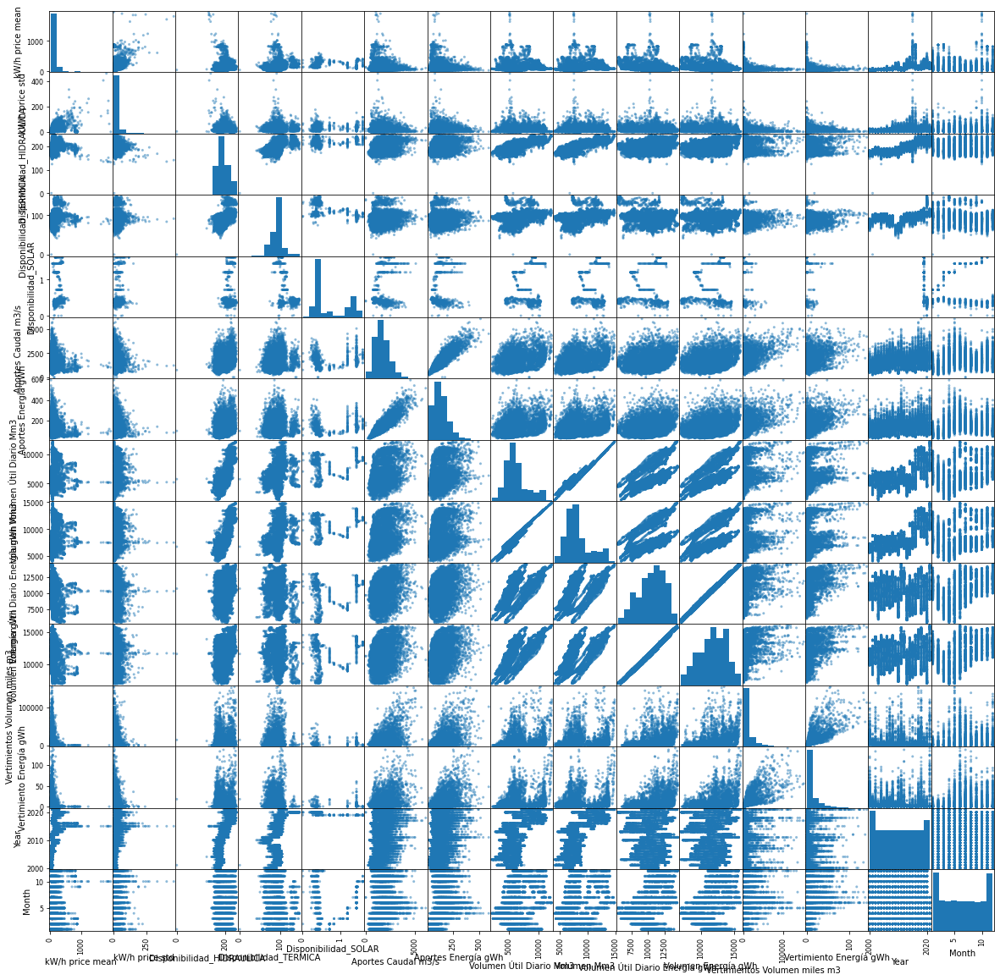

In [12]:
scatter_matrix(df, figsize=(20,20))

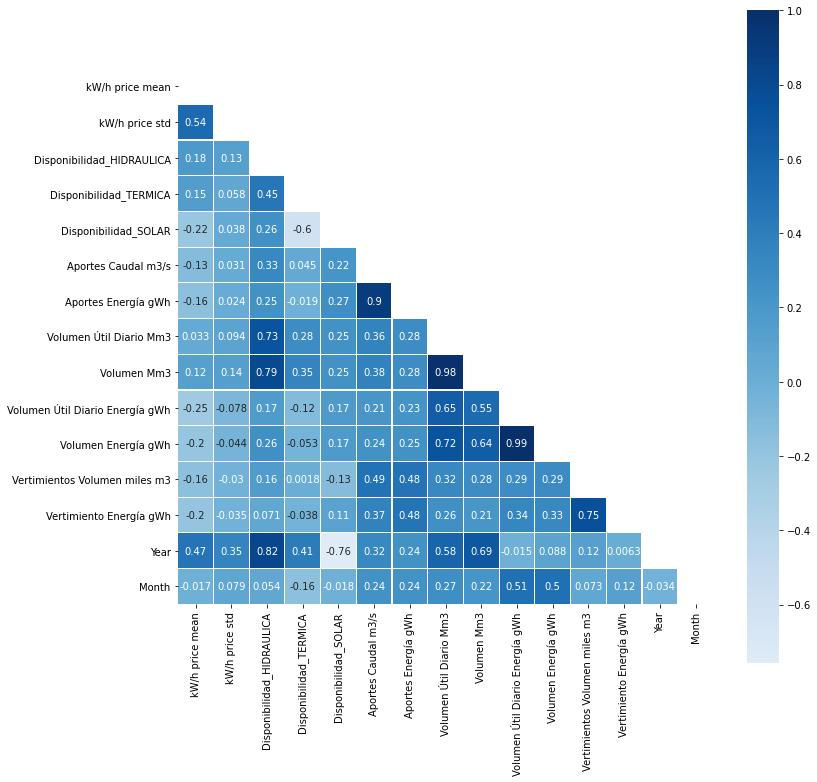

In [13]:
# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap='Blues', vmax=1, center=0,
            square=True, linewidths=.1, annot = True)

In [14]:
list_to_plot = ['kW/h price mean','Disponibilidad_HIDRAULICA',
       'Disponibilidad_TERMICA', 'Disponibilidad_SOLAR', 'Aportes Caudal m3/s',
       'Aportes Energía gWh', 'Volumen Útil Diario Mm3', 'Volumen Mm3',
       'Volumen Útil Diario Energía gWh', 'Volumen Energía gWh',
       'Vertimientos Volumen miles m3', 'Vertimiento Energía gWh']

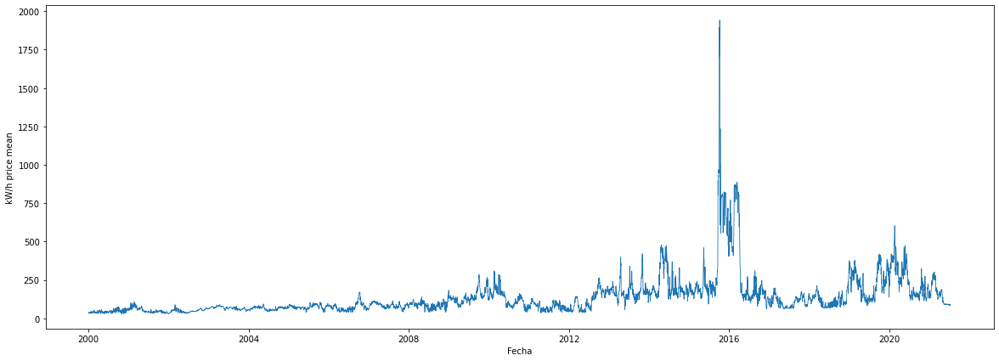

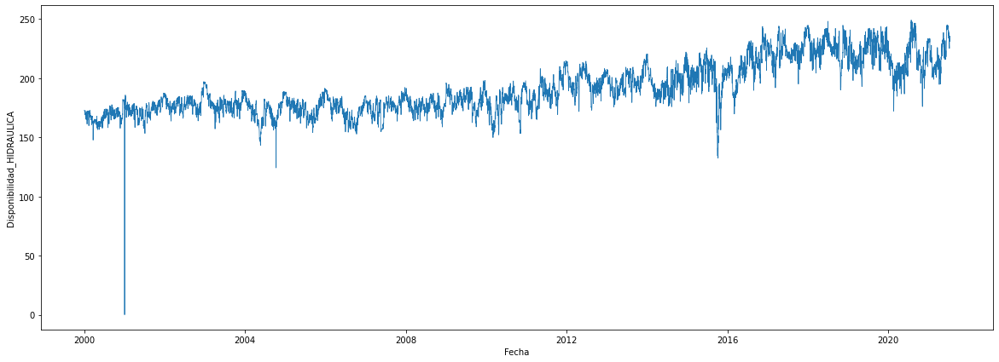

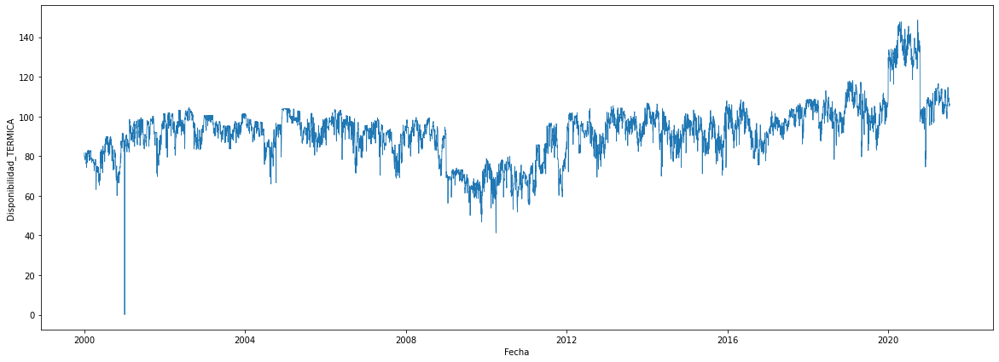

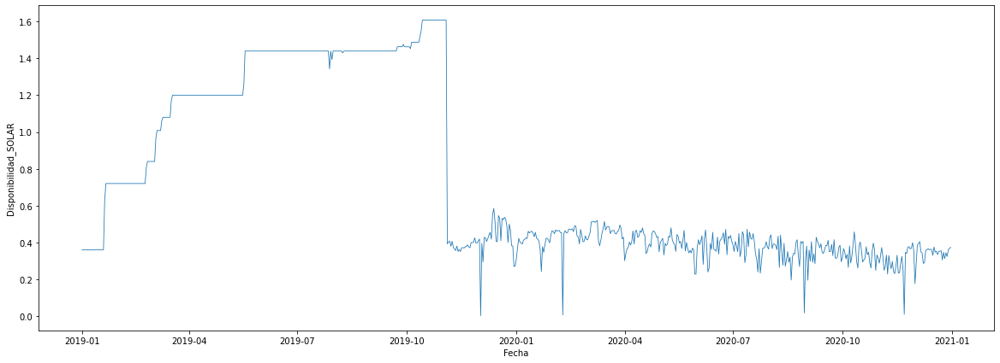

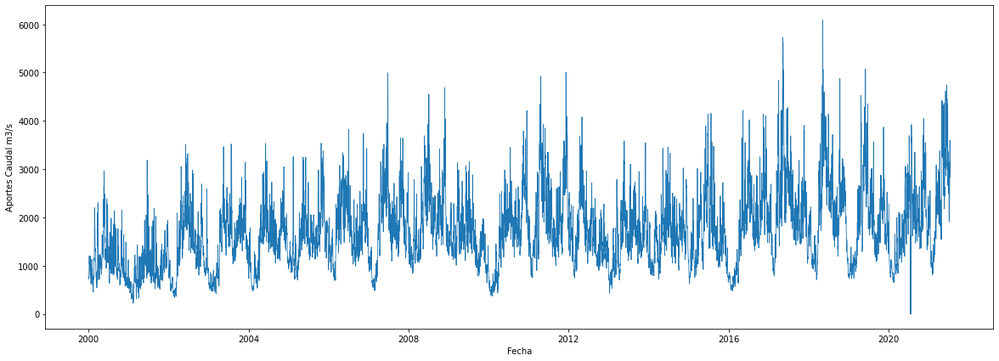

...

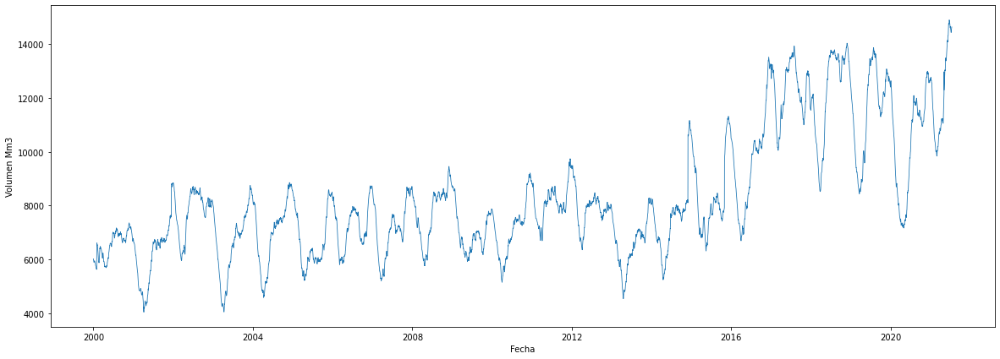

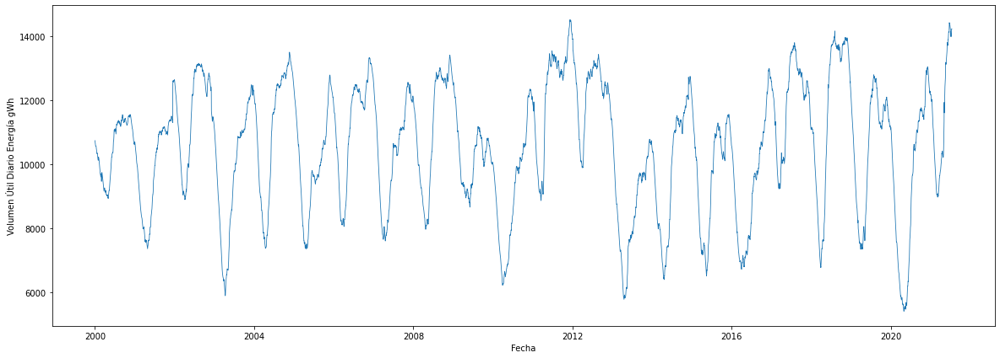

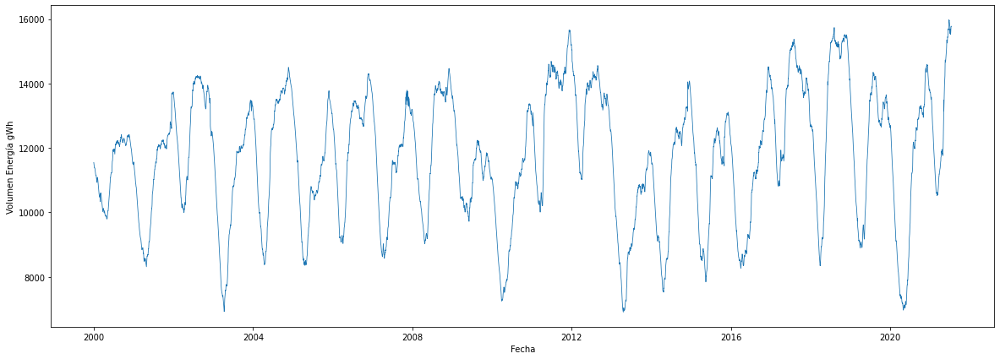

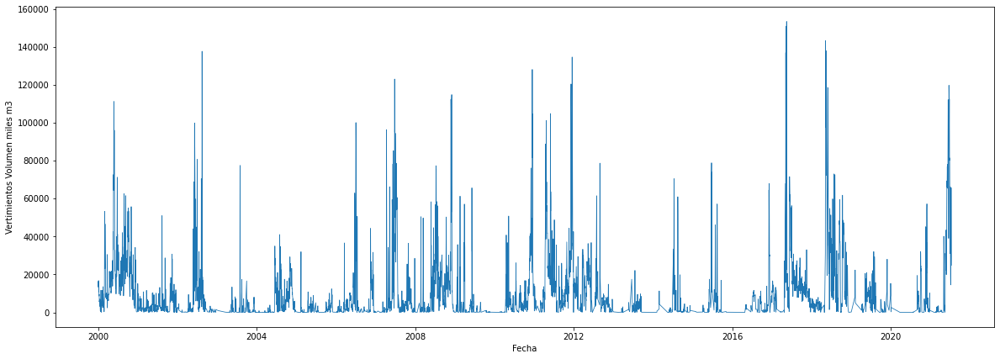

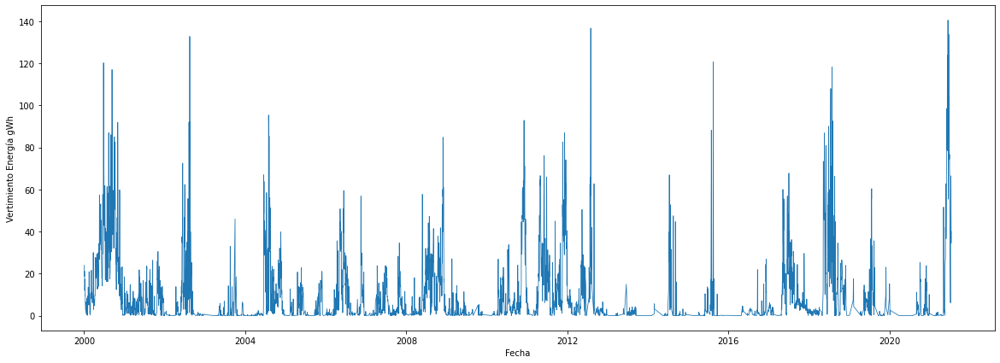

In [15]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(20,7))
  sns.lineplot(data = df, y=i, x = 'Fecha', linewidth=.8)
  plt.show()

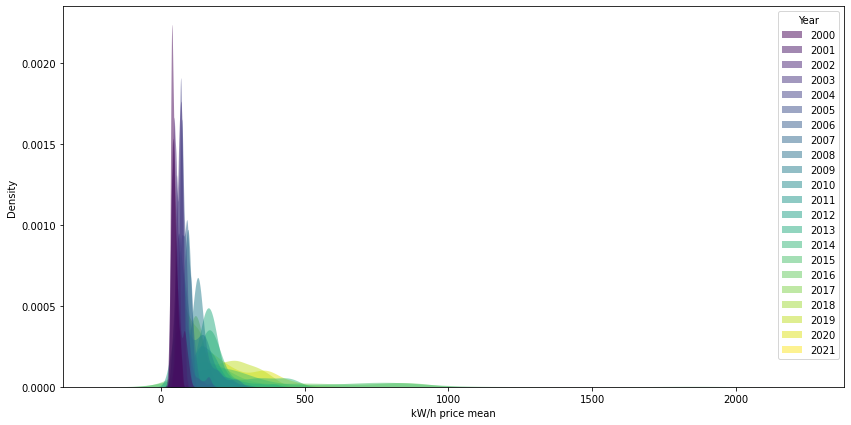

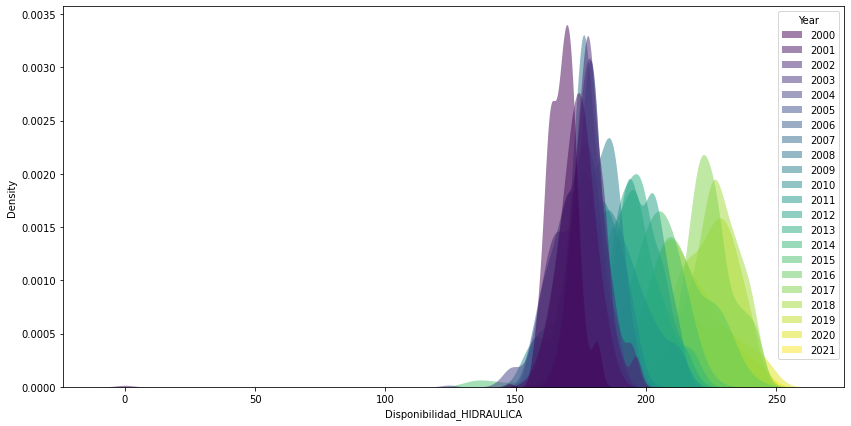

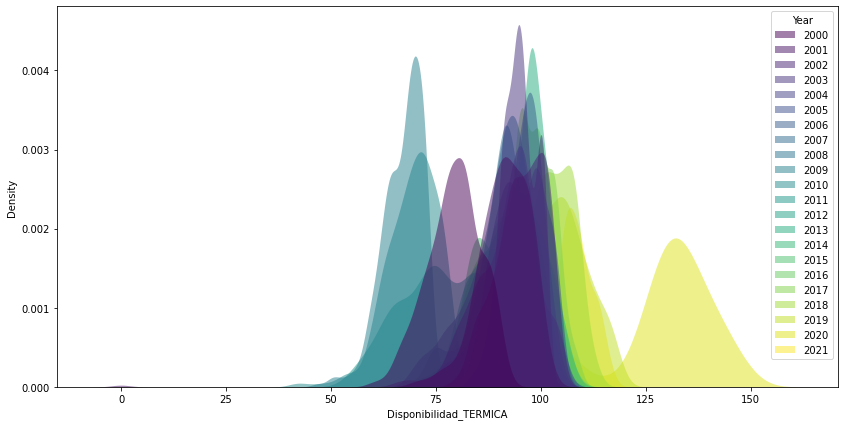

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

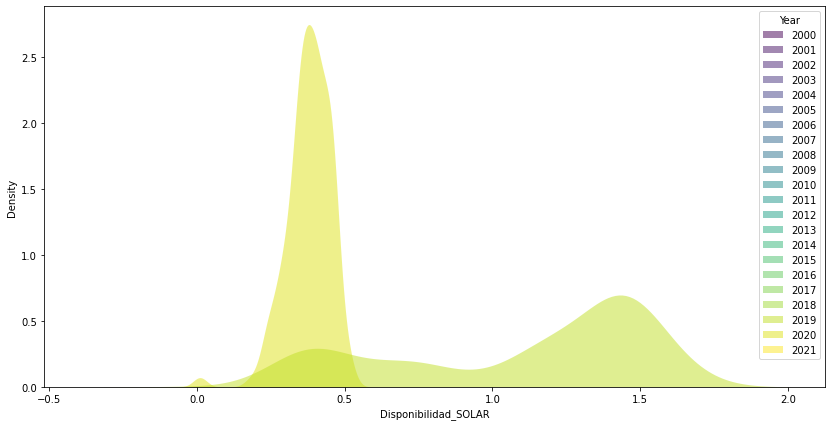

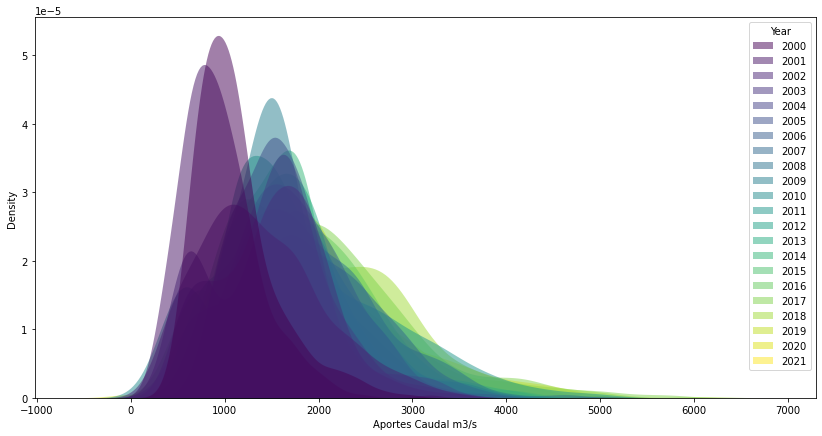

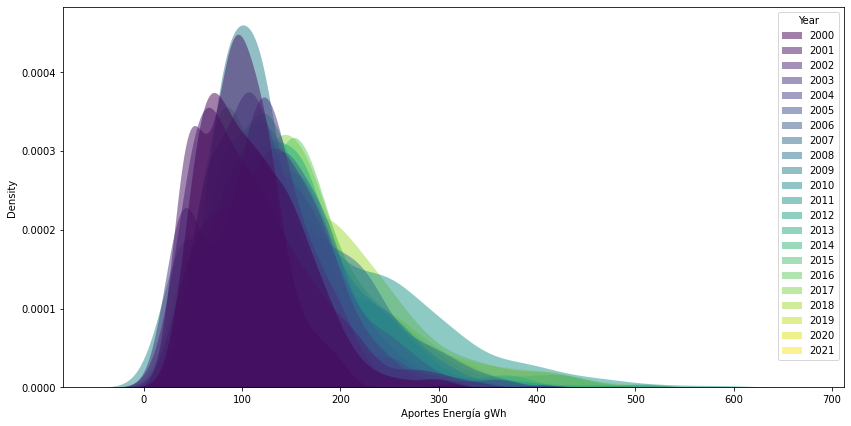

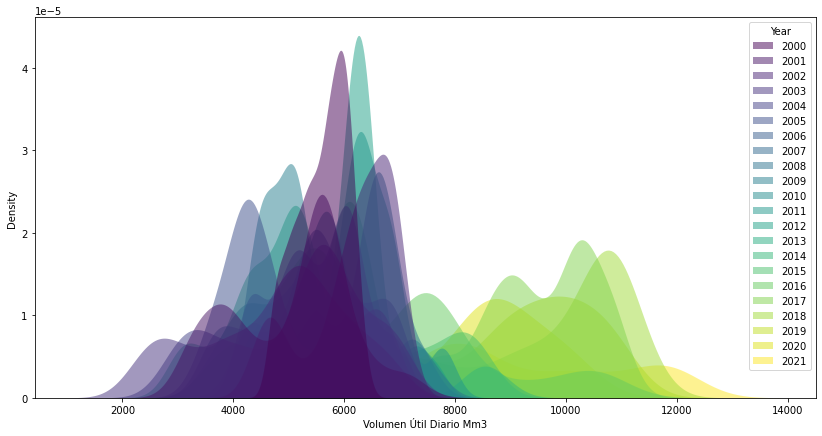

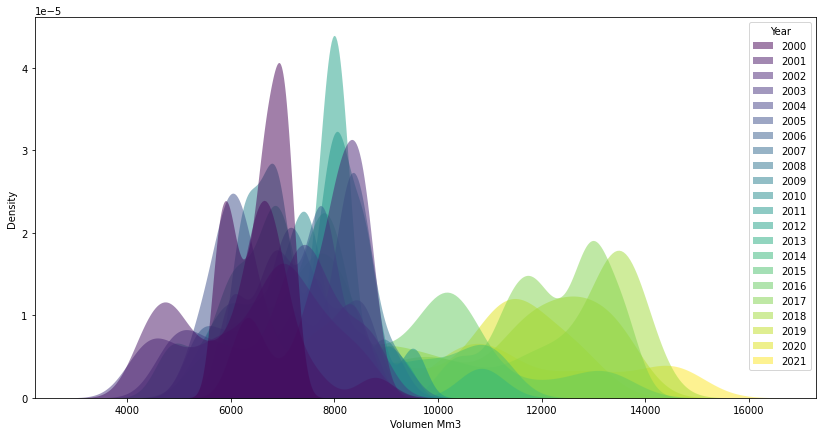

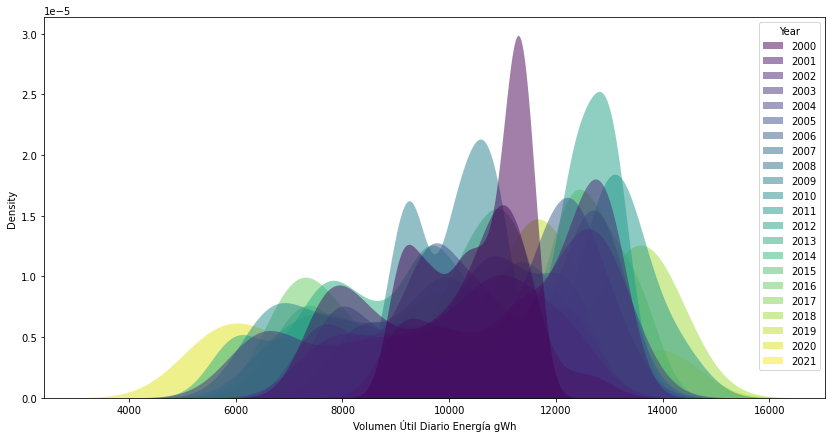

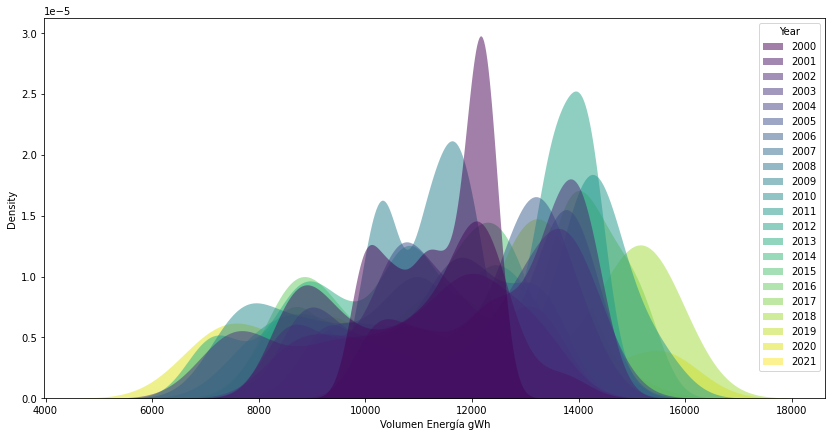

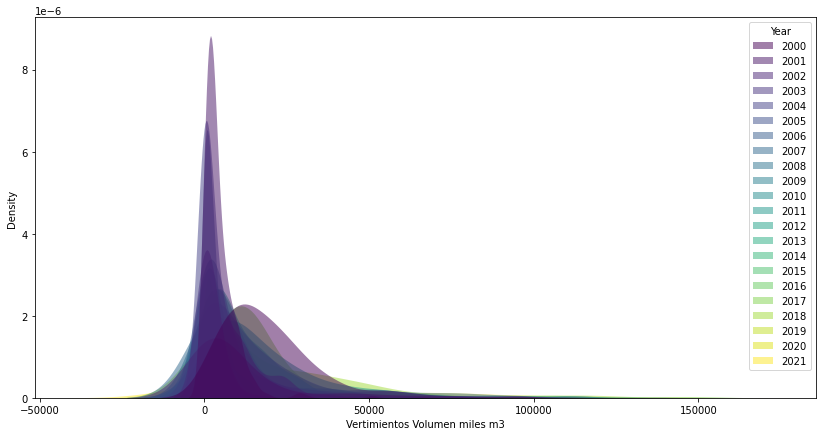

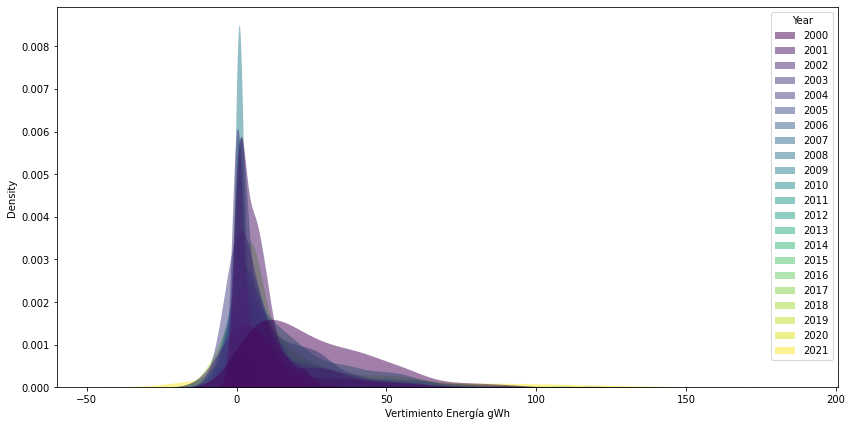

In [16]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(14,7))
  sns.kdeplot(data = df, x=i, hue = 'Year', fill=True, alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

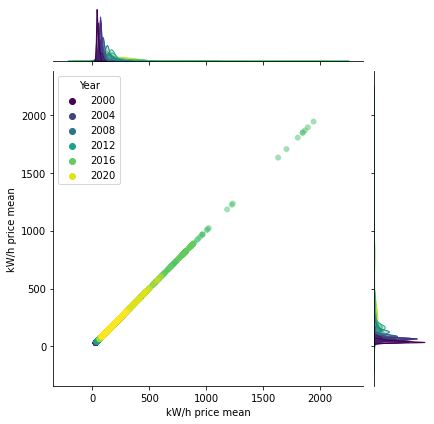

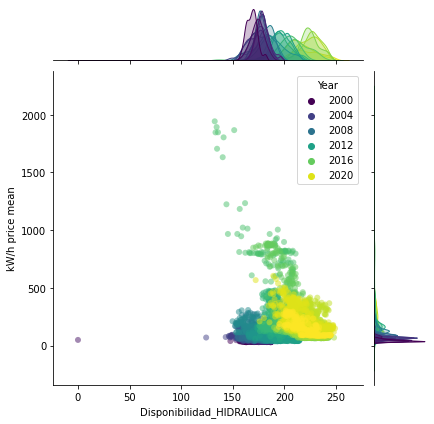

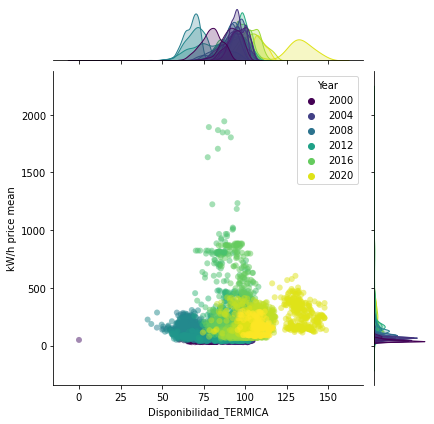

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

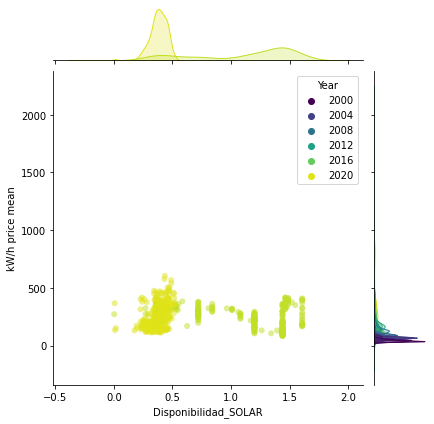

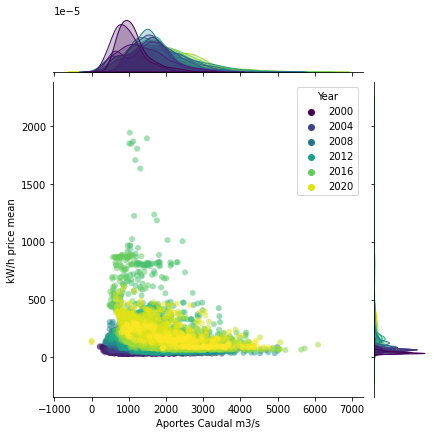

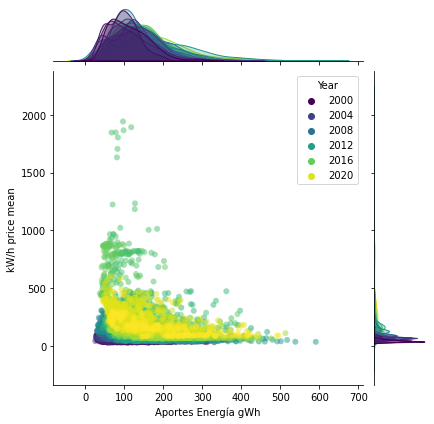

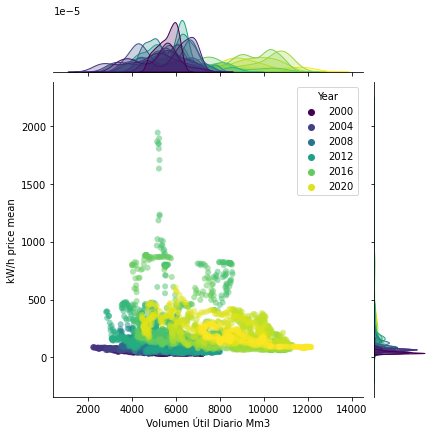

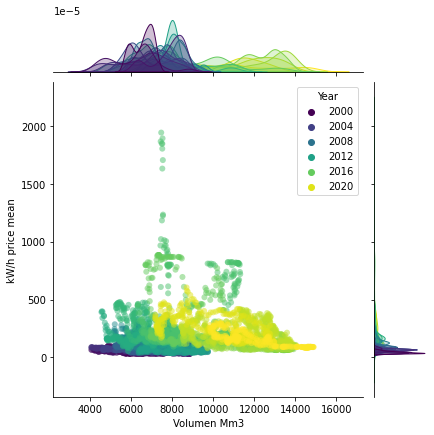

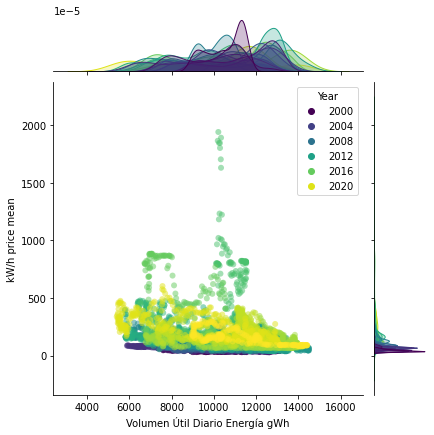

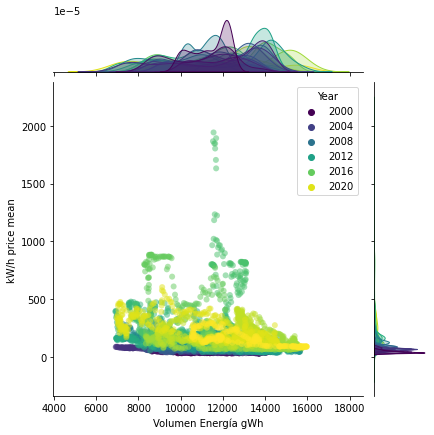

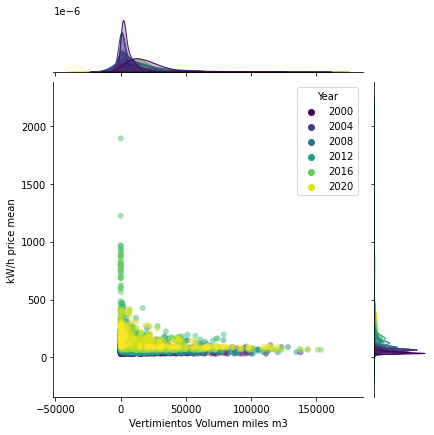

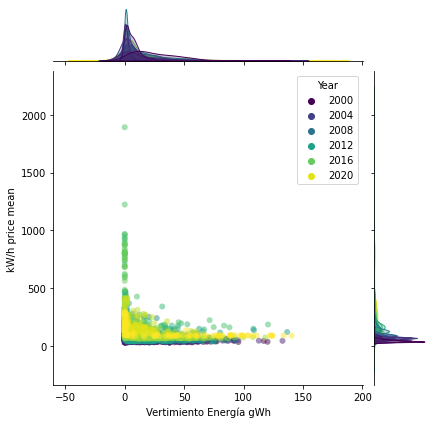

In [17]:
for i in list_to_plot:
  sns.jointplot(data = df, y='kW/h price mean', x = i, hue = 'Year', alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

In [18]:
from statsmodels.tsa.stattools import adfuller
for i in list_to_plot:
  X = df[i].values
  X = np.nan_to_num(X)
  result = adfuller(X)
  print(i), print('ADF Statistic: %f' % result[0]), print('p-value: %f' % result[1]), print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

kW/h price mean
ADF Statistic: -5.265702
p-value: 0.000006
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_HIDRAULICA
ADF Statistic: -3.321264
p-value: 0.013954
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_TERMICA
ADF Statistic: -4.359068
p-value: 0.000350
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_SOLAR
ADF Statistic: -2.927499
p-value: 0.042242
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Caudal m3/s
ADF Statistic: -7.864387
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Energía gWh
ADF Statistic: -7.488760
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Mm3
ADF Statistic: -5.164584
p-value: 0.000010
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Mm3
ADF Statistic: -4.218851
p-value: 0.000612
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Energía gWh
ADF Statistic: -8.560194
p-val

In [19]:
df_diff = df.diff()
df_diff['Year'] = df['Year']
df_diff['Month'] = df['Month']

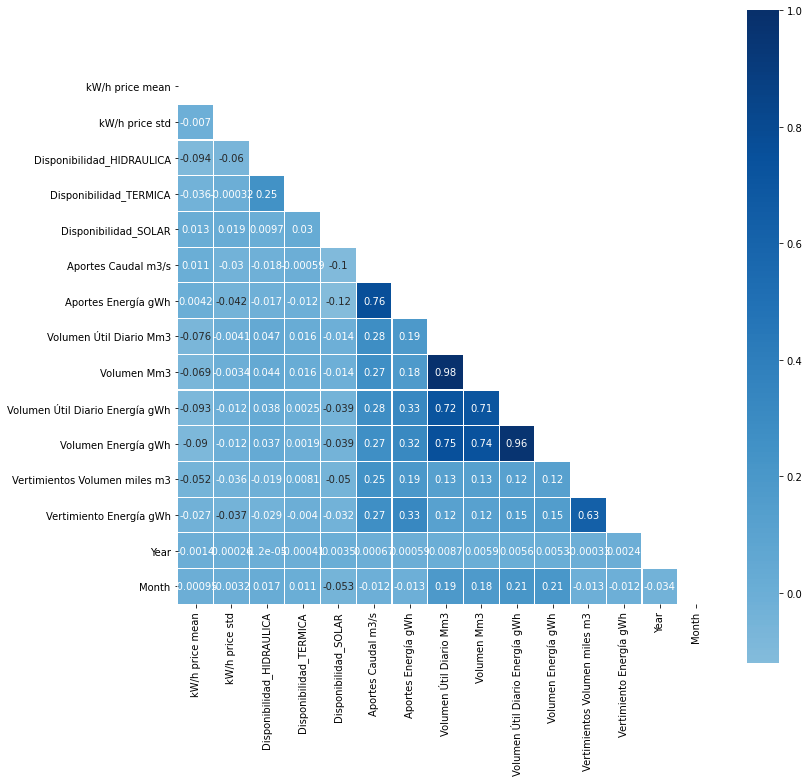

In [20]:
# Compute the correlation matrix
corr_diff = df_diff.corr(method='pearson')

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_diff, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_diff, mask=mask, cmap='Blues', vmax=1, center=0,
            square=True, linewidths=.1, annot = True)

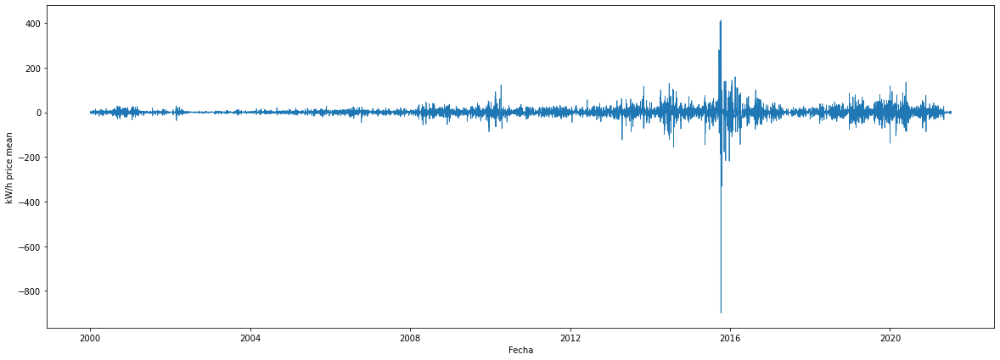

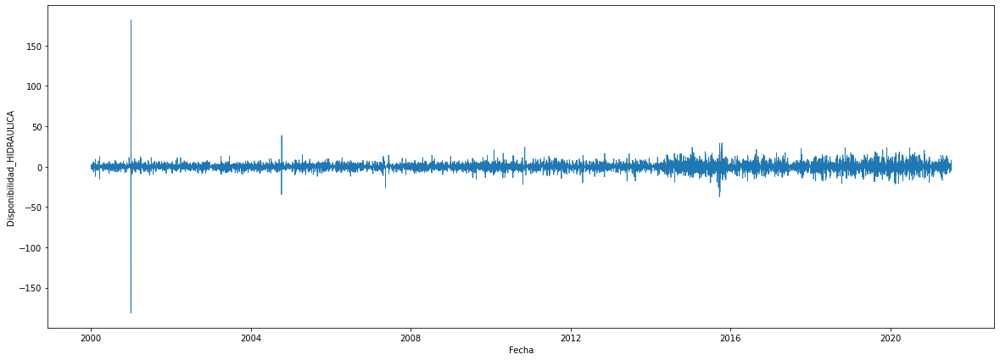

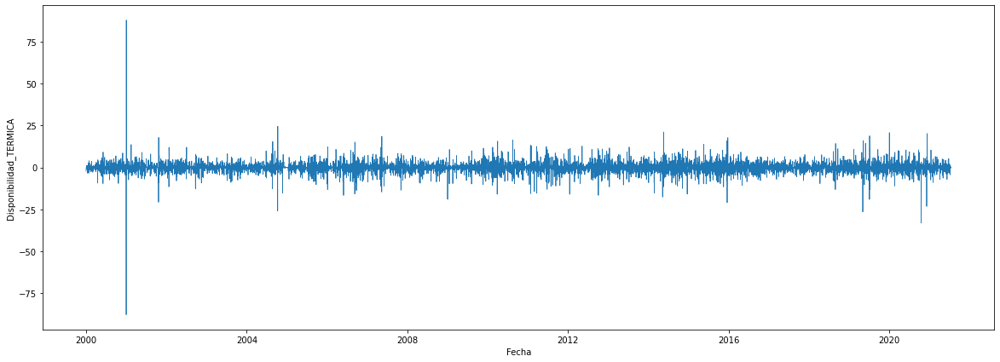

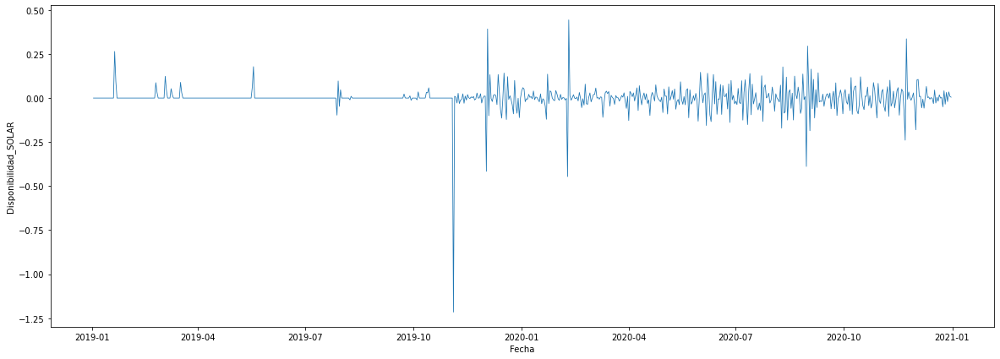

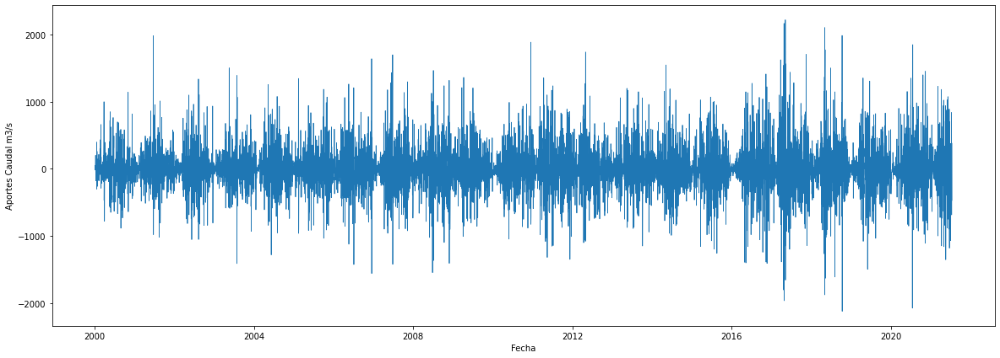

...

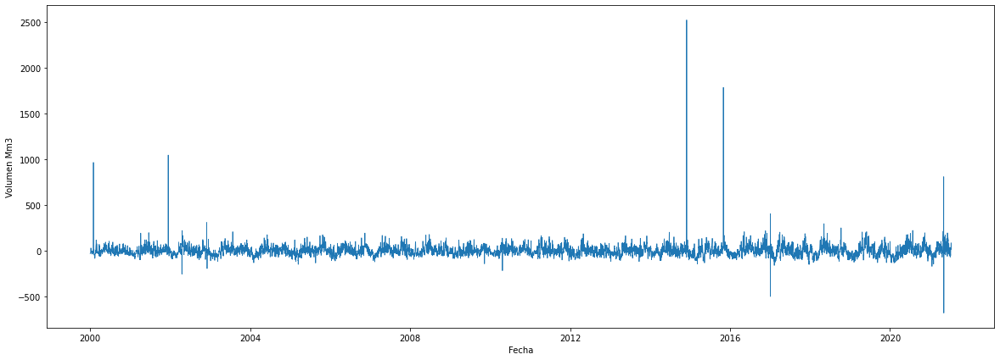

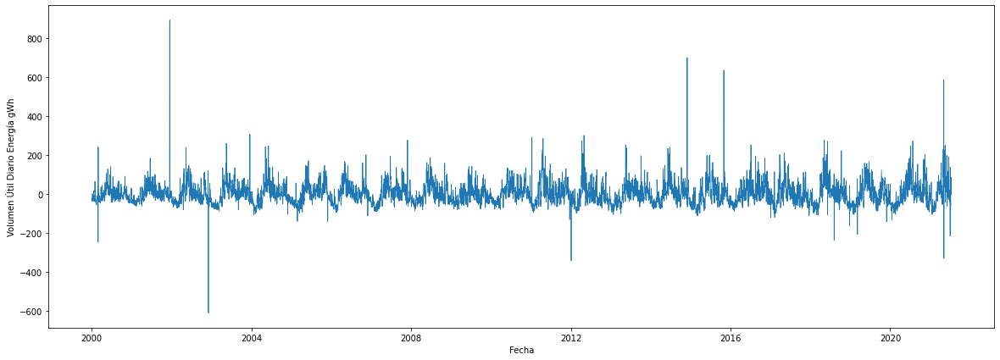

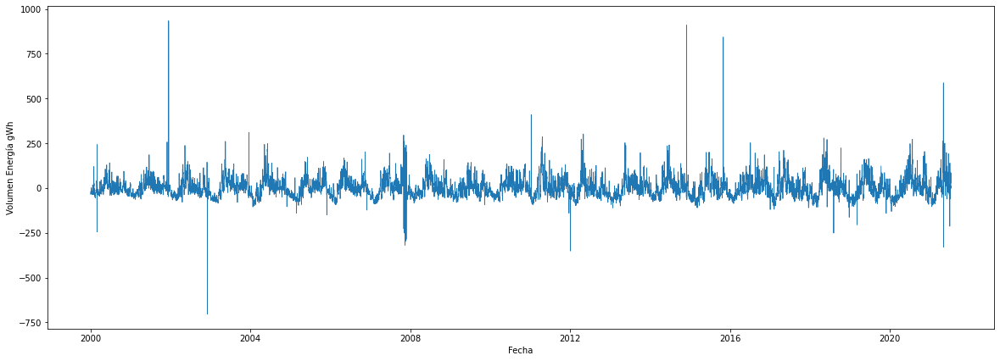

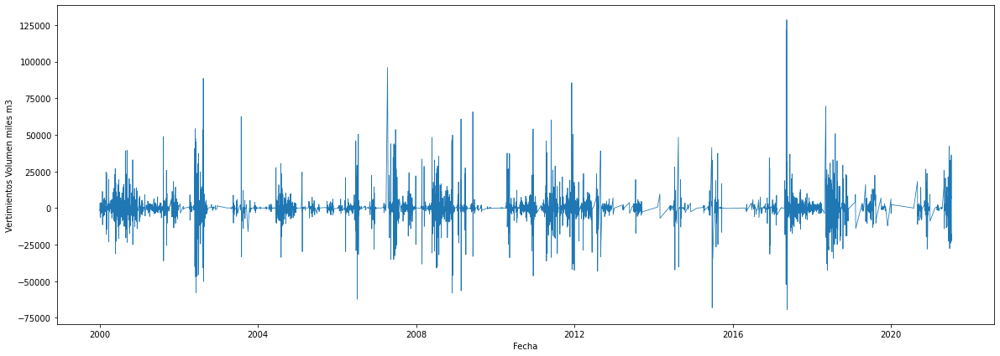

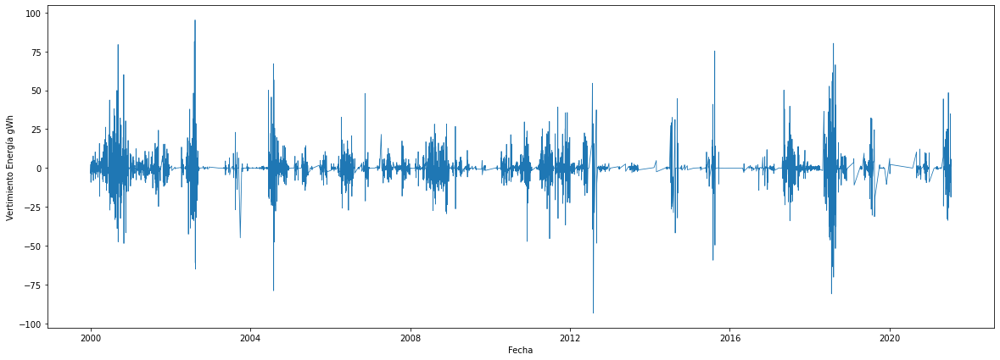

In [21]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(20,7))
  sns.lineplot(data = df_diff, y=i, x = 'Fecha', linewidth=.8)
  plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

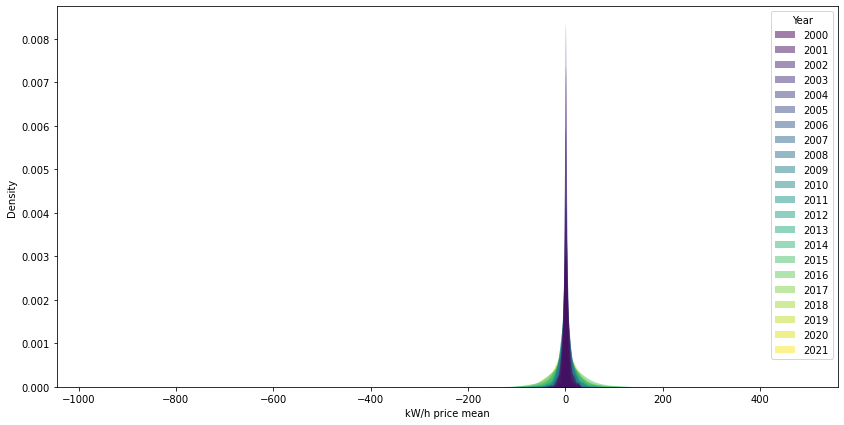

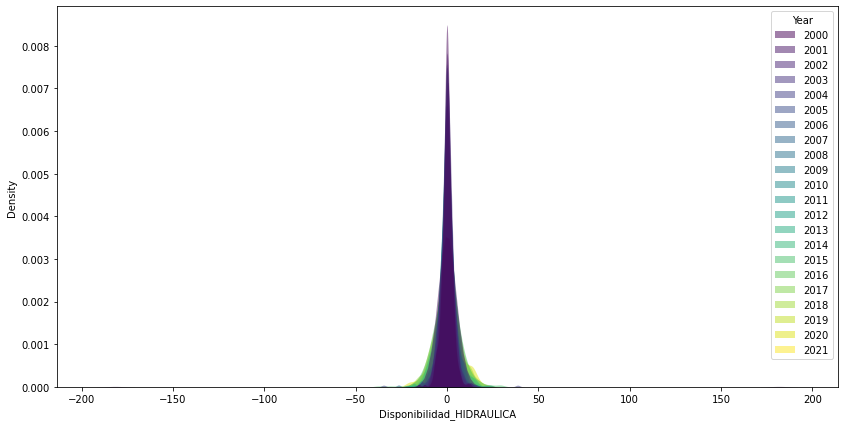

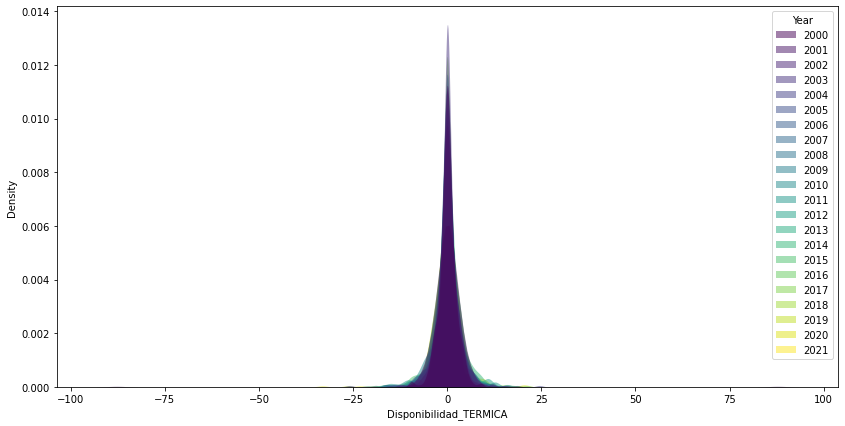

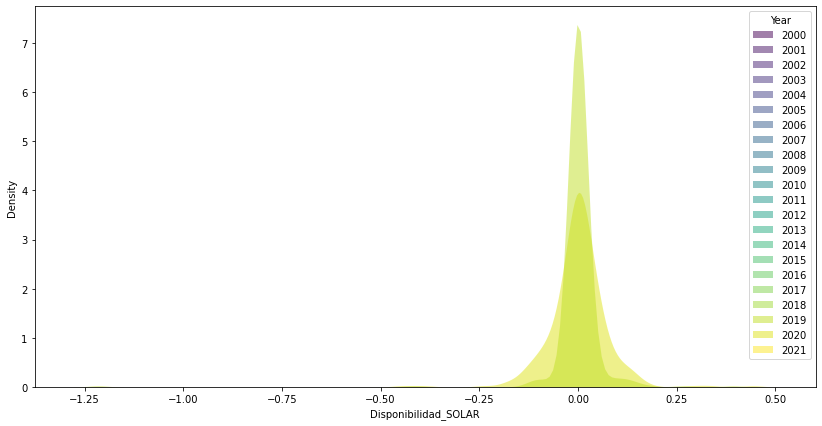

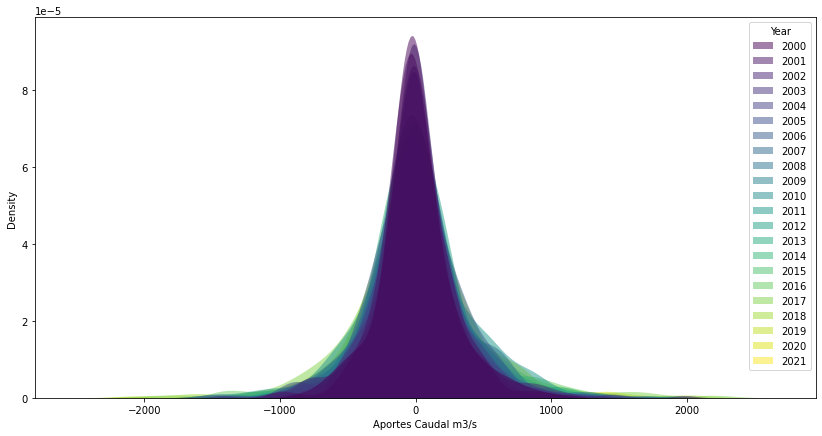

...

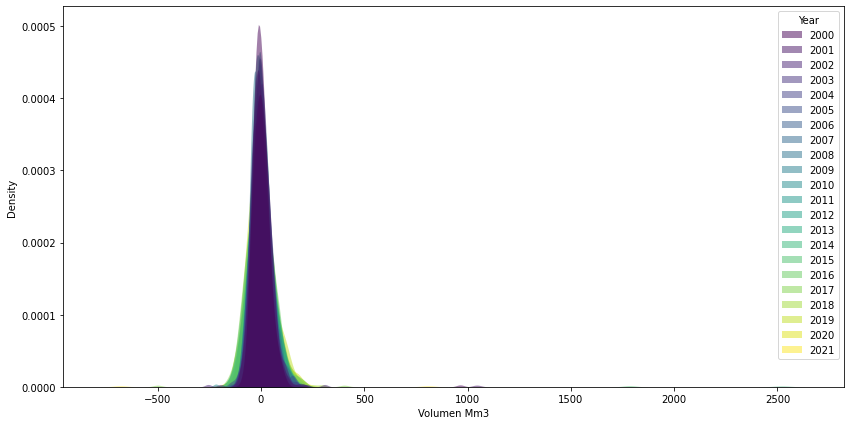

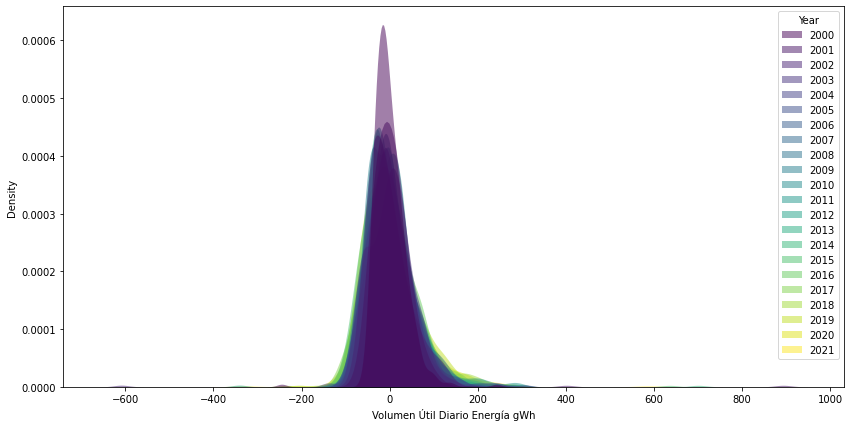

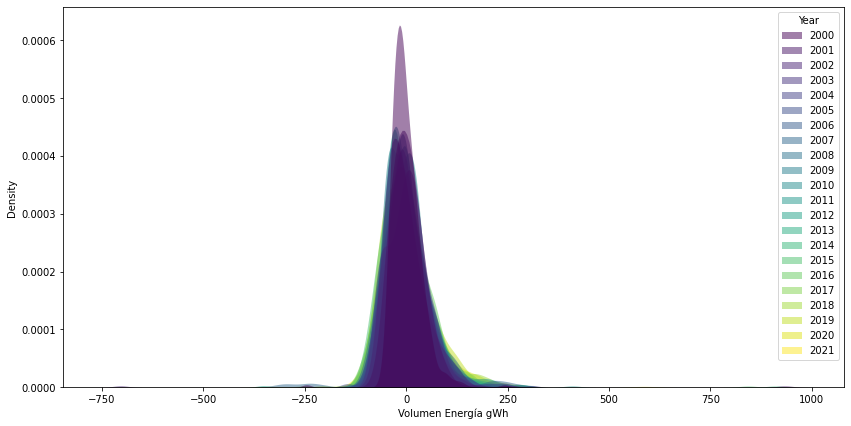

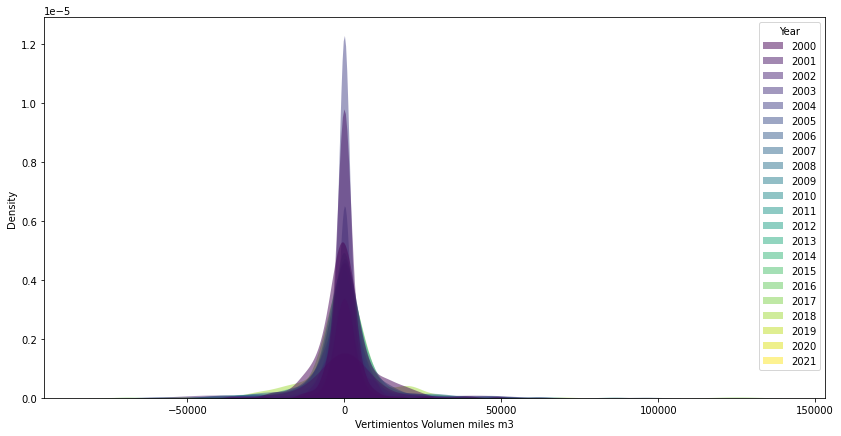

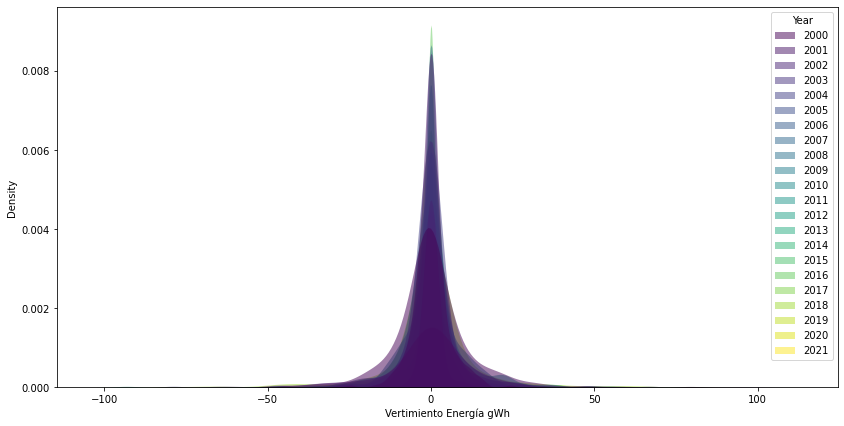

In [22]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(14,7))
  sns.kdeplot(data = df_diff, x=i, hue = 'Year', fill=True, alpha=.5, linewidth=0, palette = 'viridis')

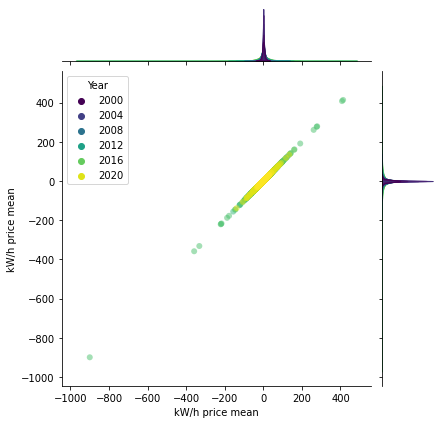

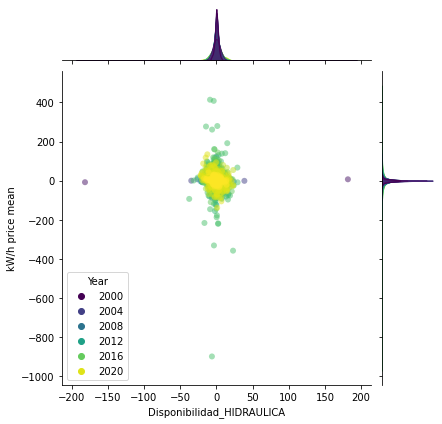

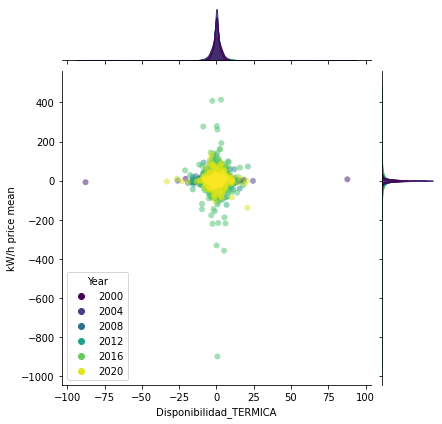

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

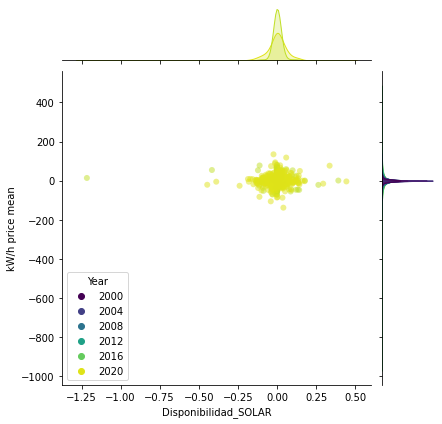

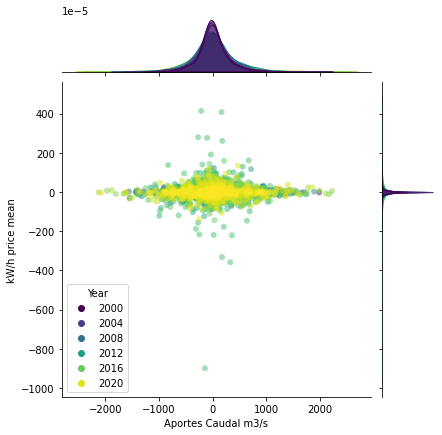

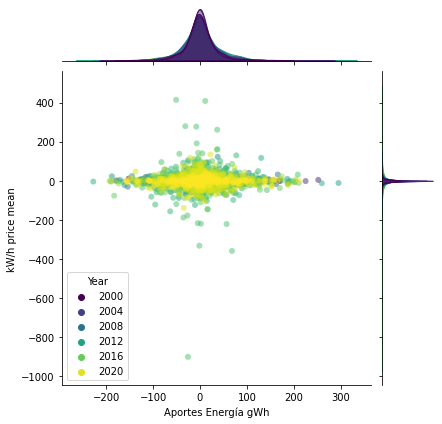

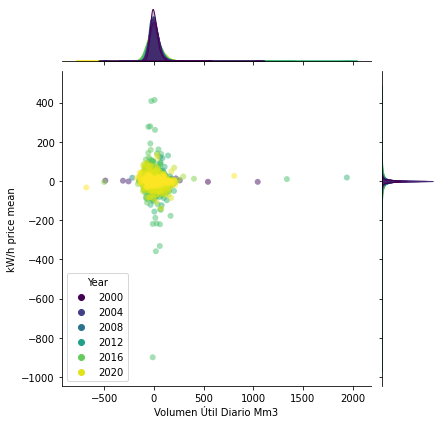

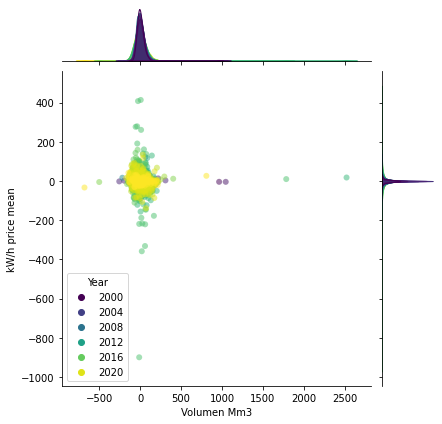

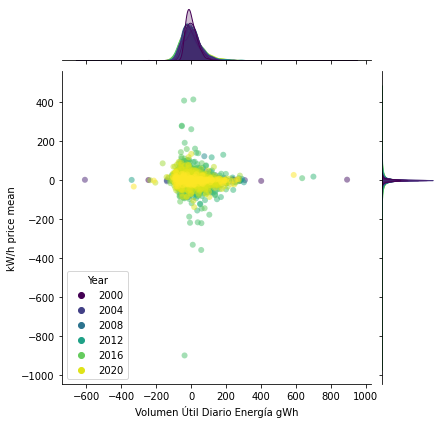

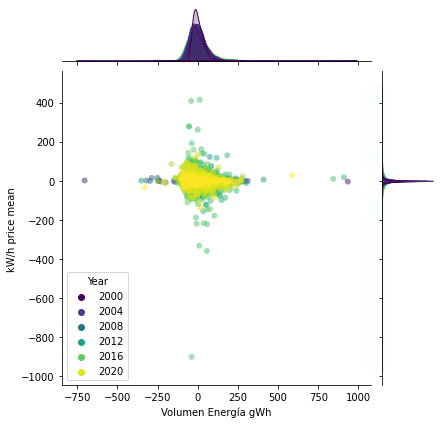

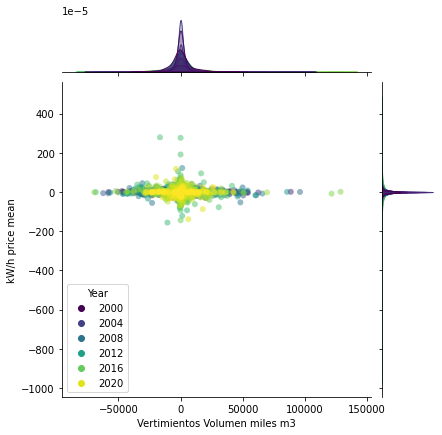

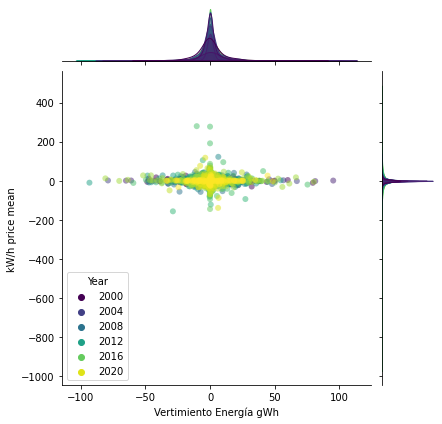

In [23]:
for i in list_to_plot:
  sns.jointplot(data = df_diff, y='kW/h price mean', x = i, hue = 'Year', alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

In [24]:
from statsmodels.tsa.stattools import adfuller
for i in list_to_plot:
  X = df_diff[i].values
  X = np.nan_to_num(X)
  result = adfuller(X)
  print(i), print('ADF Statistic: %f' % result[0]), print('p-value: %f' % result[1]), print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

kW/h price mean
ADF Statistic: -17.408643
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_HIDRAULICA
ADF Statistic: -17.542752
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_TERMICA
ADF Statistic: -22.017038
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_SOLAR
ADF Statistic: -16.006918
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Caudal m3/s
ADF Statistic: -25.517893
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Energía gWh
ADF Statistic: -26.584909
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Mm3
ADF Statistic: -11.735317
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Mm3
ADF Statistic: -12.039872
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Energía gWh
ADF Statistic: -9.0184

In [25]:
df_log = np.log(df + 1)
df_log['Year'] = df['Year']
df_log['Month'] = df['Month']

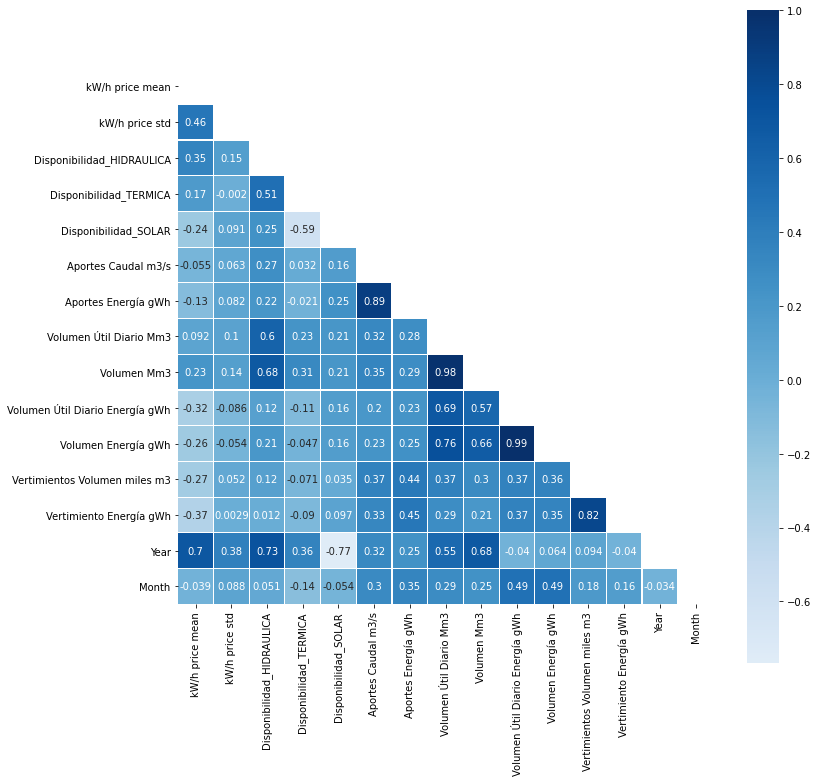

In [26]:
# Compute the correlation matrix
corr_log = df_log.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_log, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 12))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_log, mask=mask, cmap='Blues', vmax=1, center=0,
            square=True, linewidths=.1, annot = True)

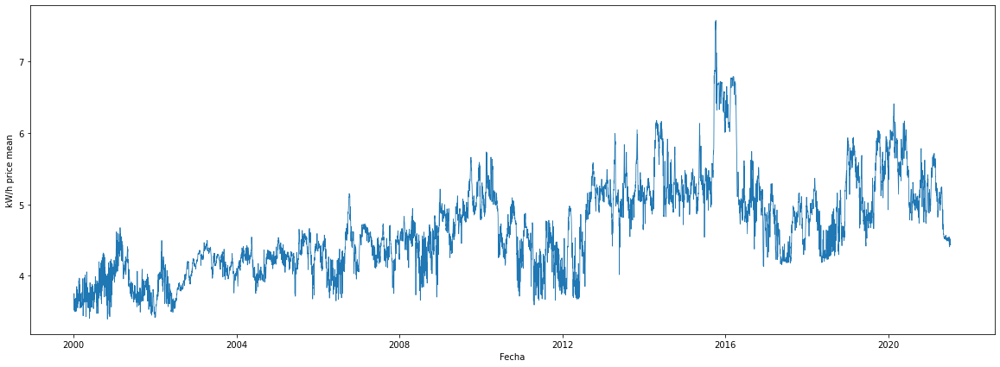

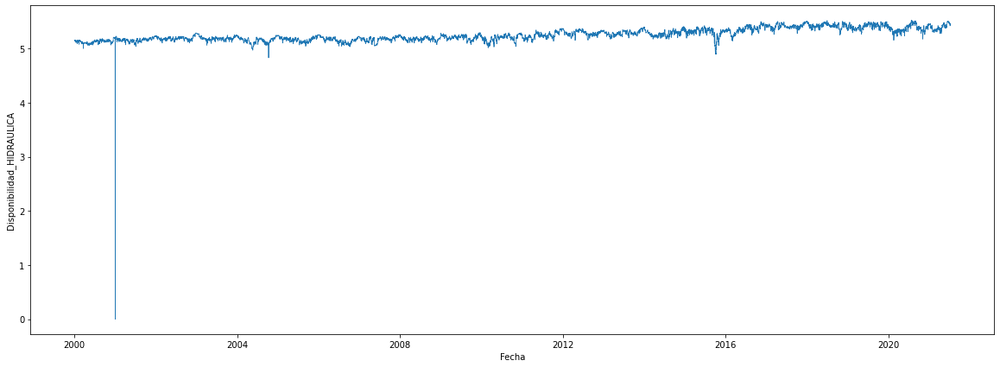

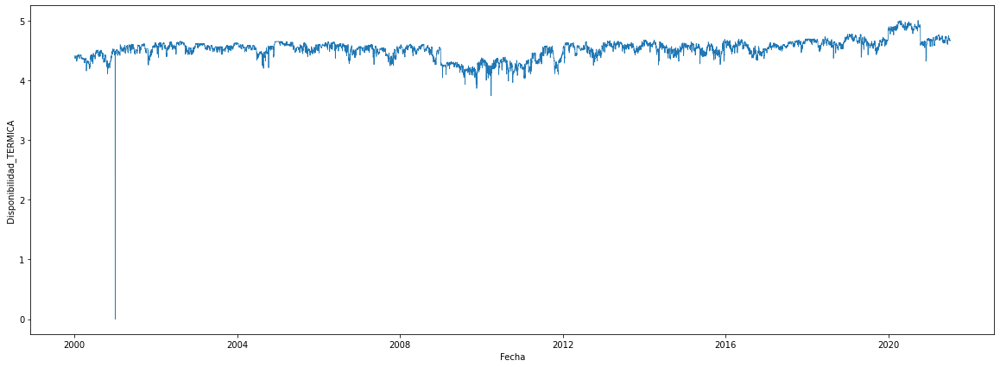

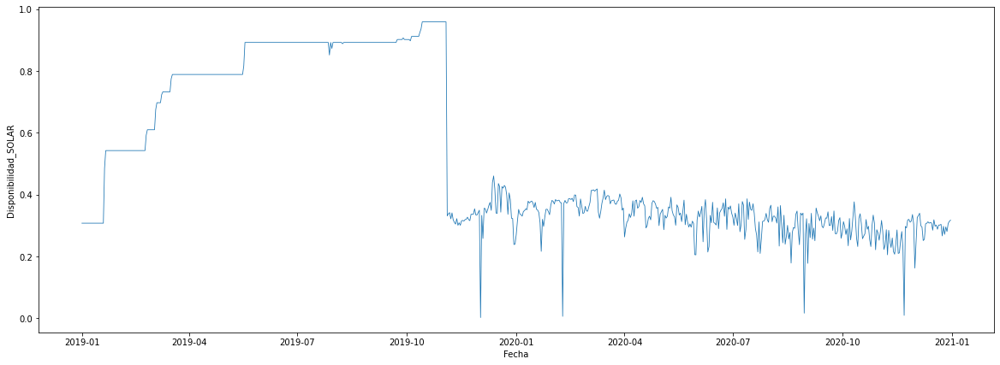

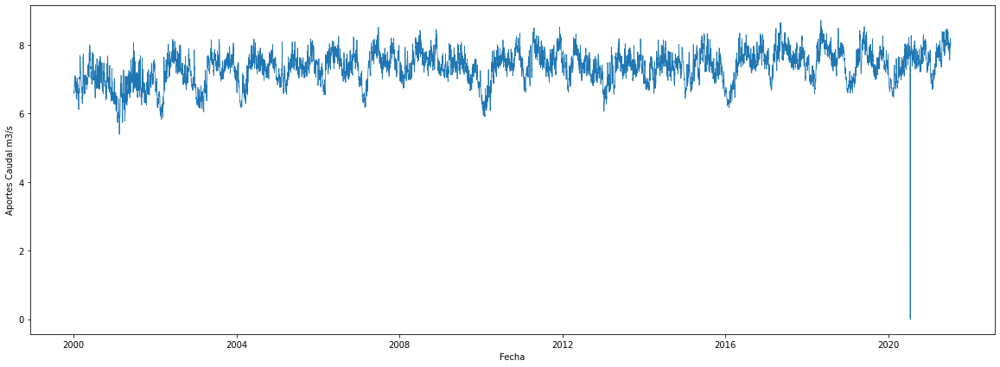

...

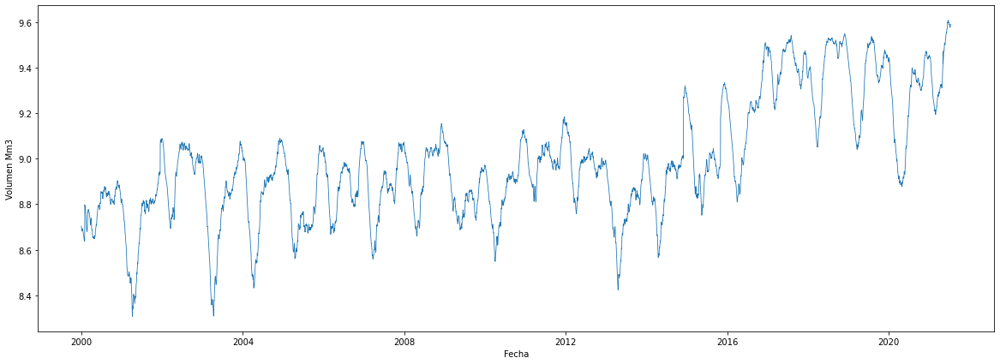

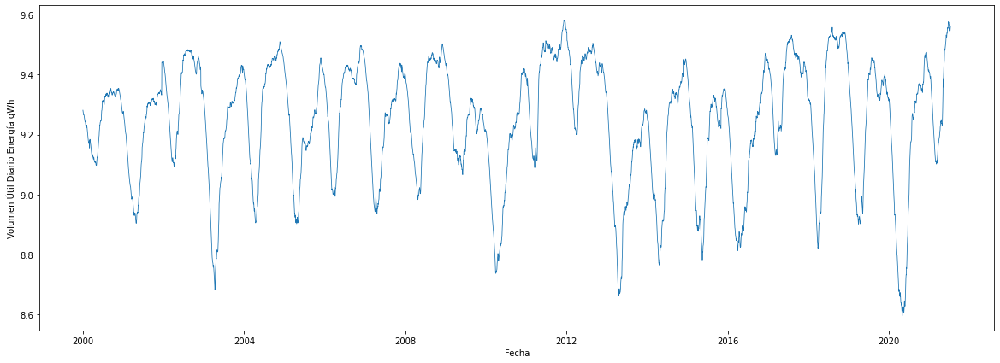

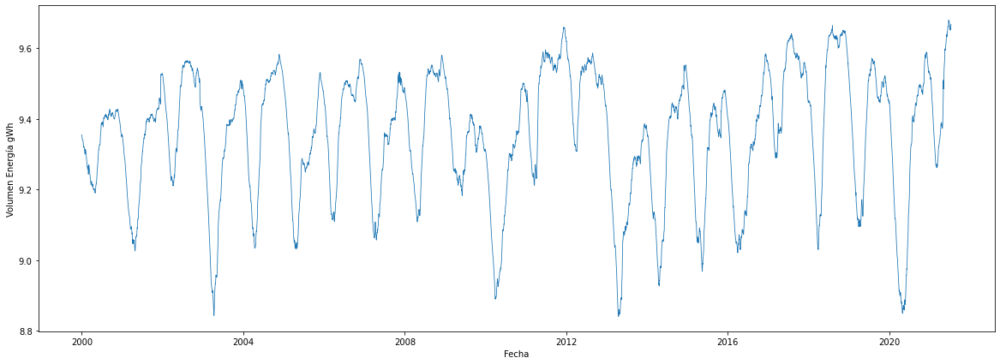

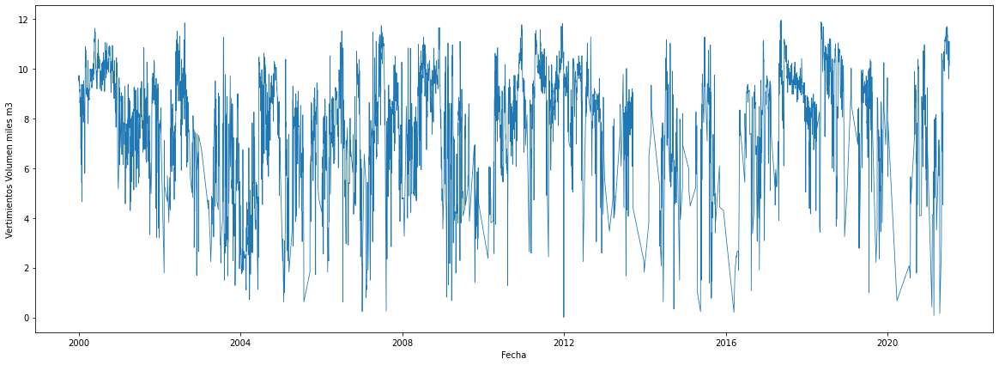

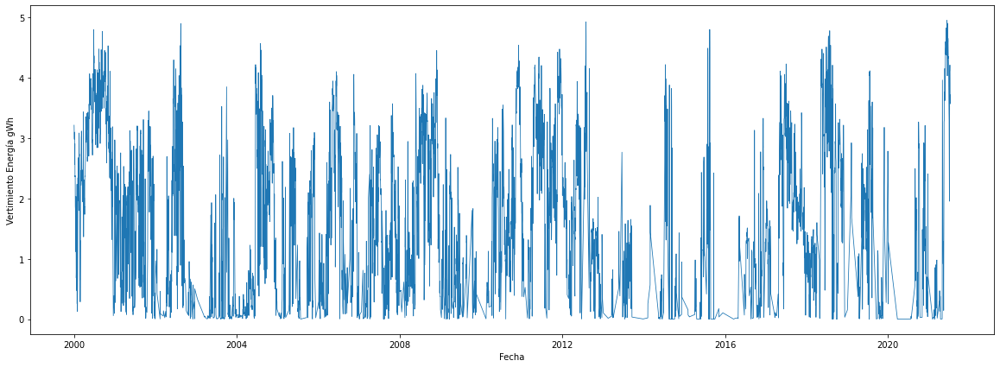

In [27]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(20,7))
  sns.lineplot(data = df_log, y=i, x = 'Fecha', linewidth=.8)
  plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

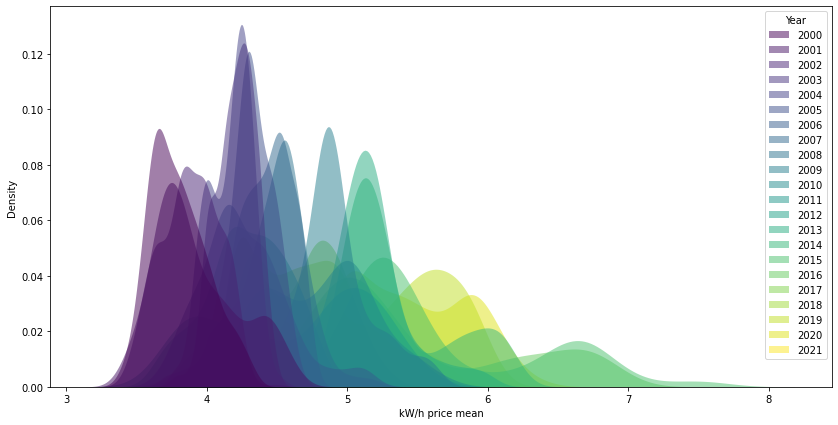

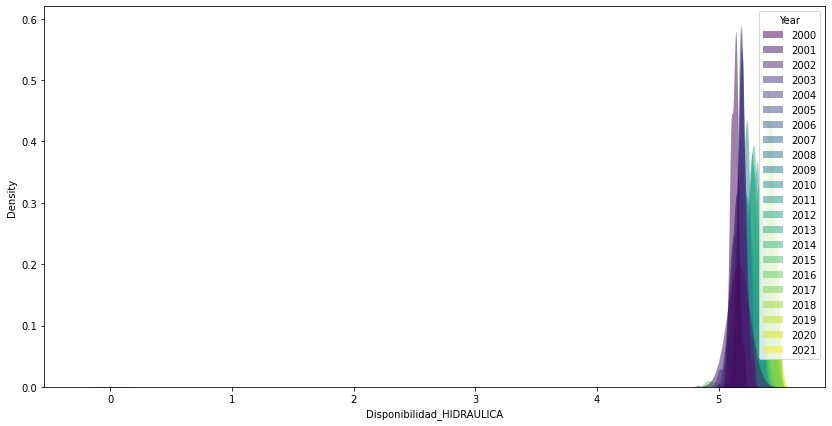

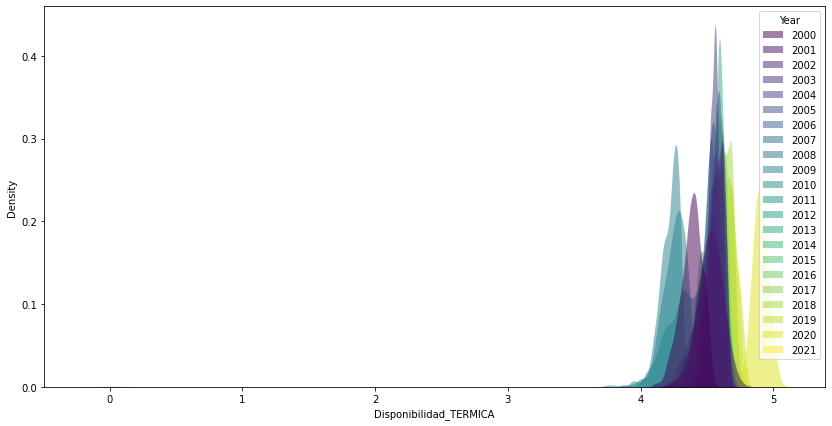

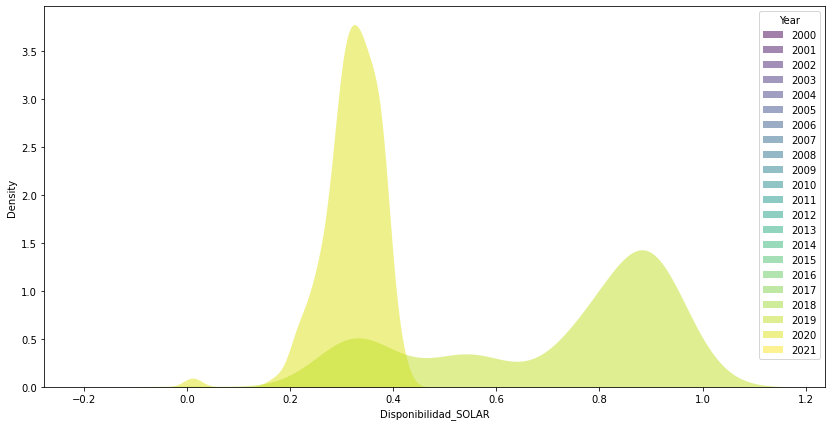

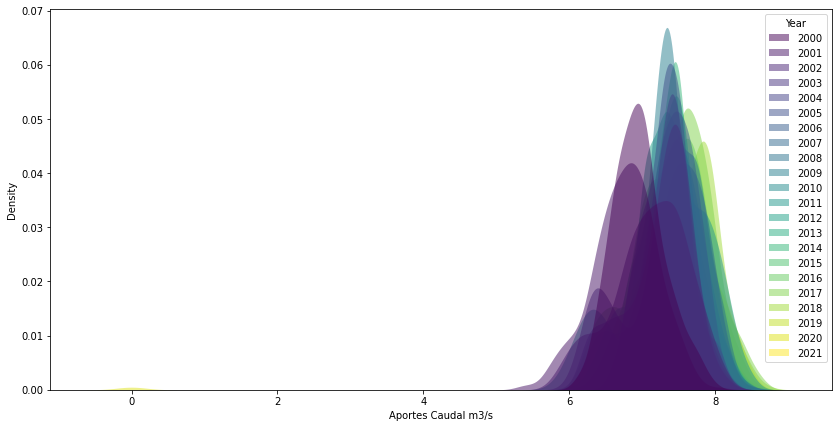

...

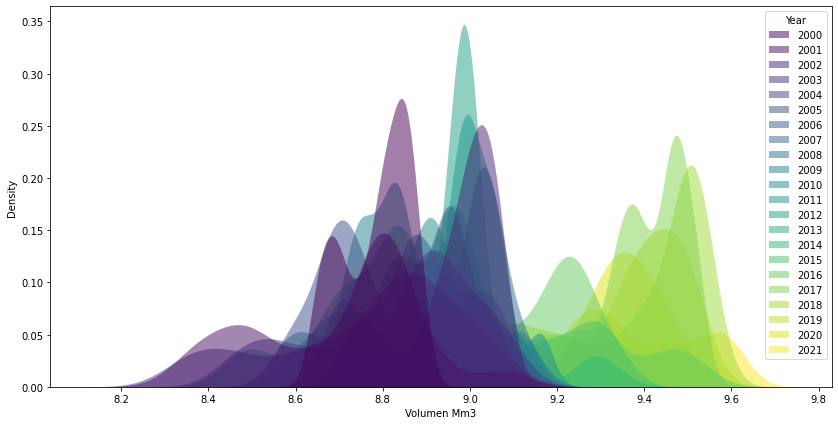

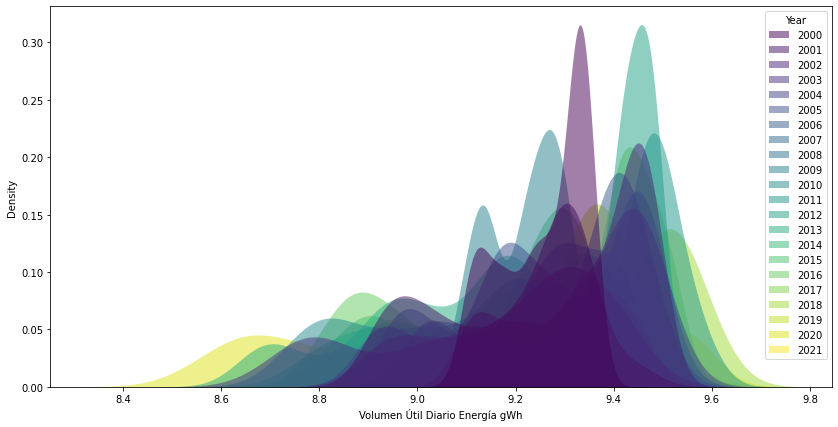

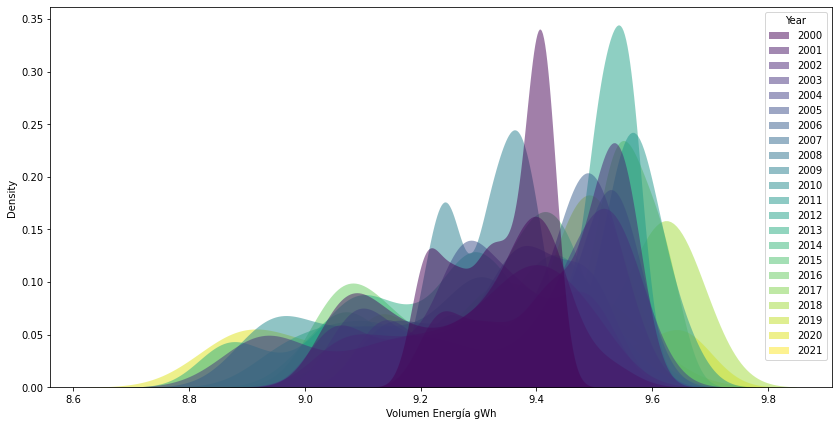

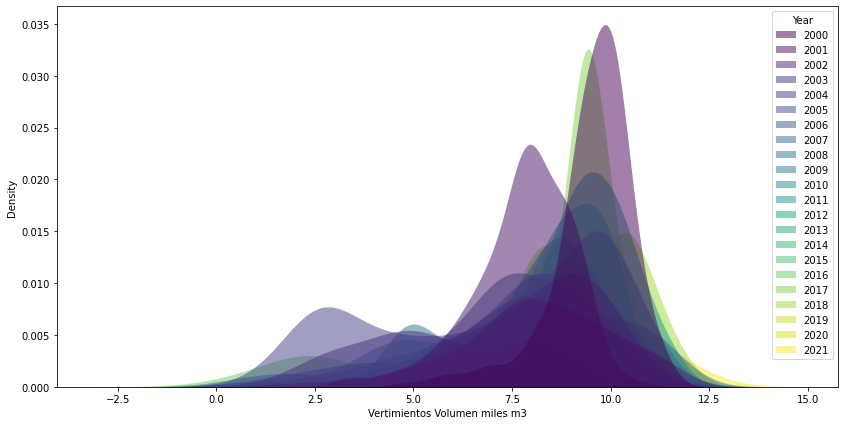

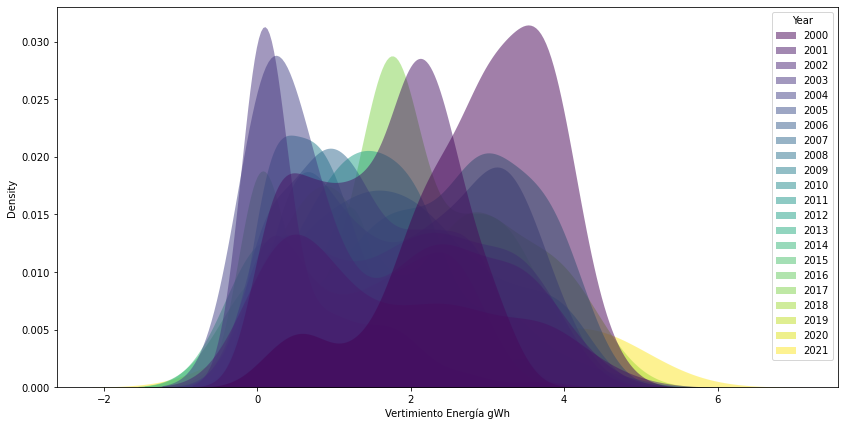

In [28]:
for i in list_to_plot:
  fig, ax = plt.subplots(figsize=(14,7))
  sns.kdeplot(data = df_log, x=i, hue = 'Year', fill=True, alpha=.5, linewidth=0, palette = 'viridis')

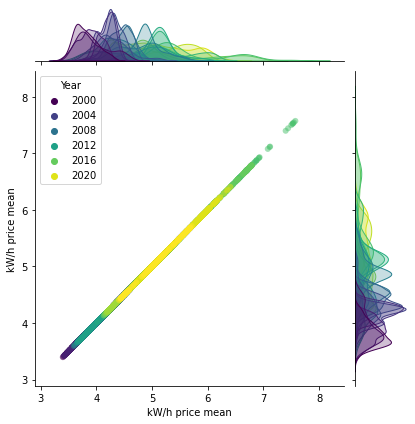

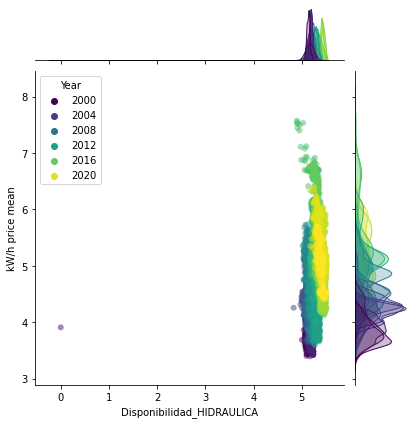

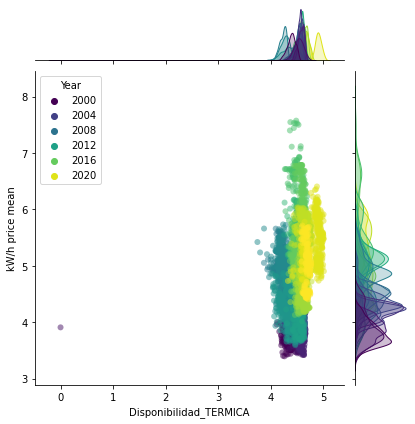

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

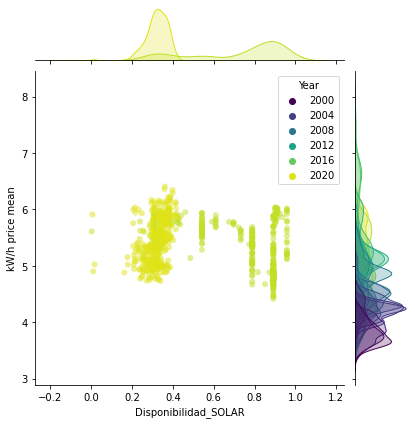

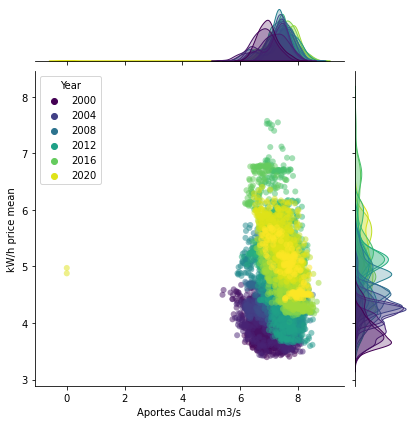

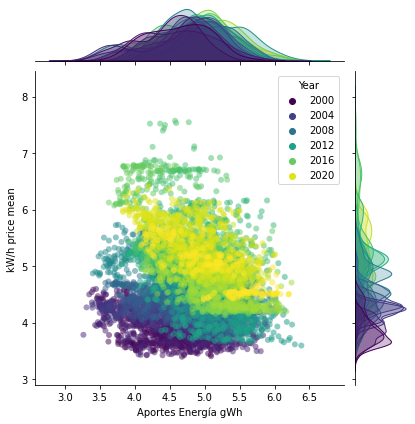

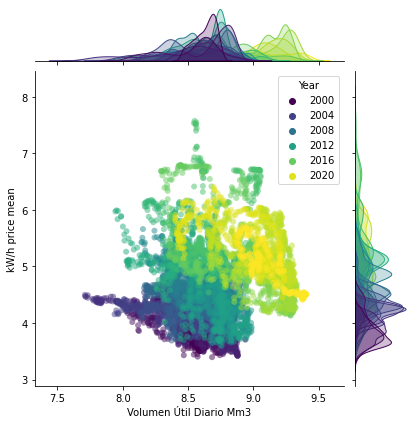

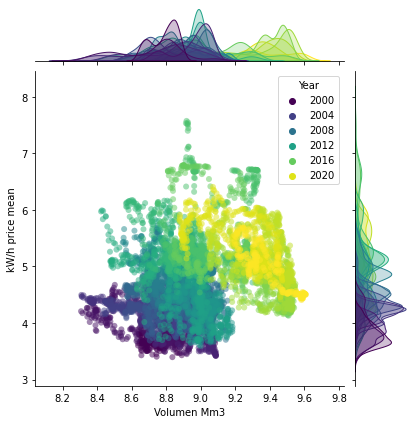

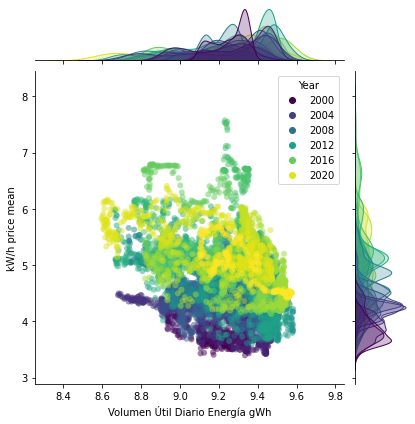

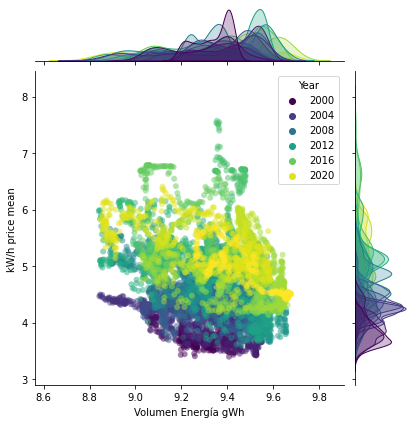

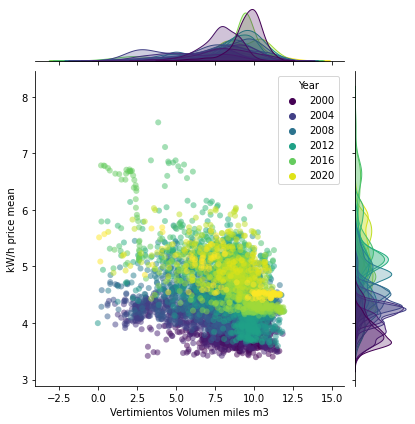

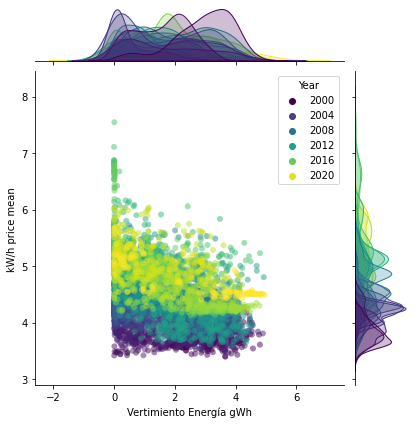

In [29]:
for i in list_to_plot:
  sns.jointplot(data = df_log, y='kW/h price mean', x = i, hue = 'Year', alpha=.5, linewidth=0, palette = 'viridis')
  plt.show()

In [30]:
for i in list_to_plot:
  X = df_log[i].fillna(0)
  result = adfuller(X)
  print(i), print('ADF Statistic: %f' % result[0]), print('p-value: %f' % result[1]), print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

kW/h price mean
ADF Statistic: -4.166376
p-value: 0.000751
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_HIDRAULICA
ADF Statistic: -3.588113
p-value: 0.005992
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_TERMICA
ADF Statistic: -4.766252
p-value: 0.000063
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Disponibilidad_SOLAR
ADF Statistic: -2.737266
p-value: 0.067809
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Caudal m3/s
ADF Statistic: -7.182758
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Aportes Energía gWh
ADF Statistic: -7.326371
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Mm3
ADF Statistic: -6.363663
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Mm3
ADF Statistic: -5.142287
p-value: 0.000012
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Volumen Útil Diario Energía gWh
ADF Statistic: -8.771637
p-val

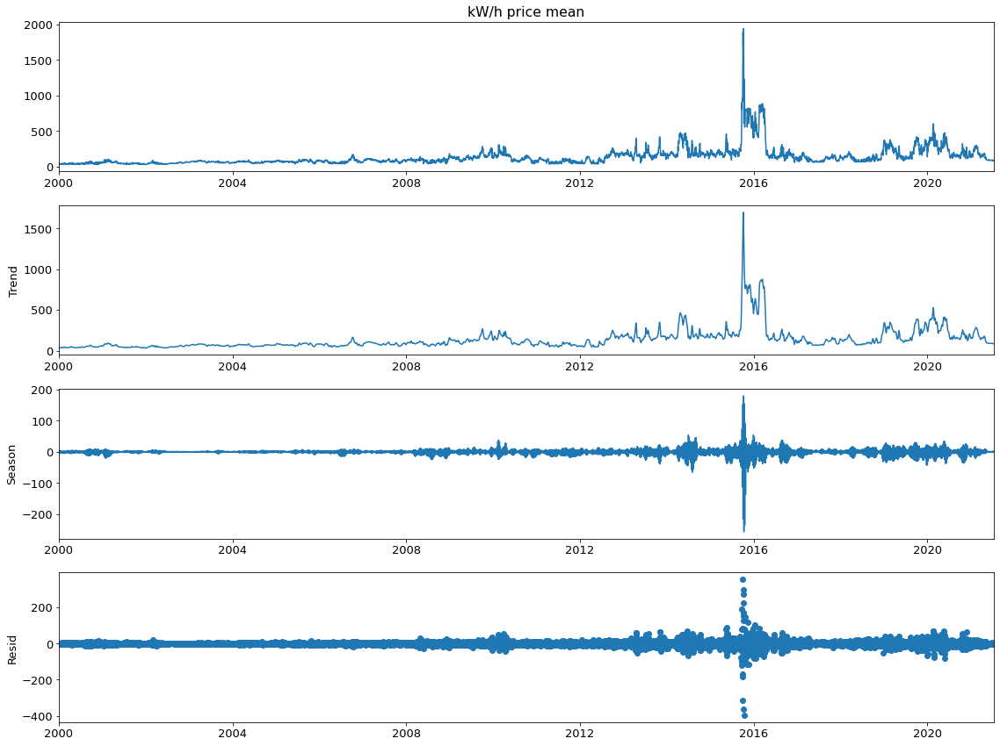

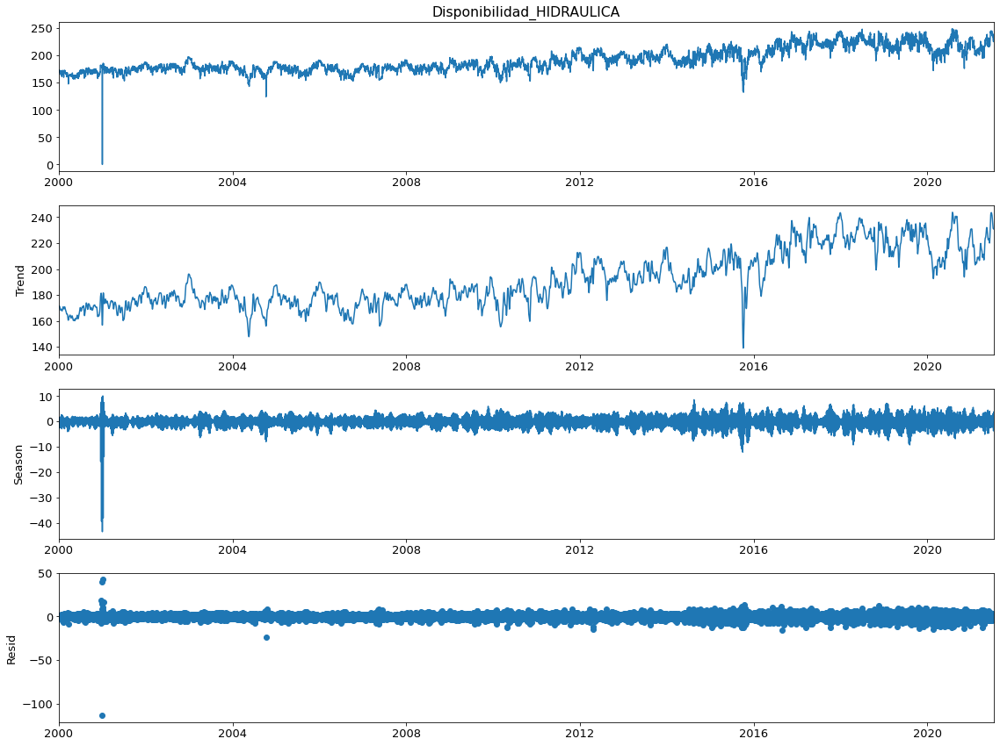

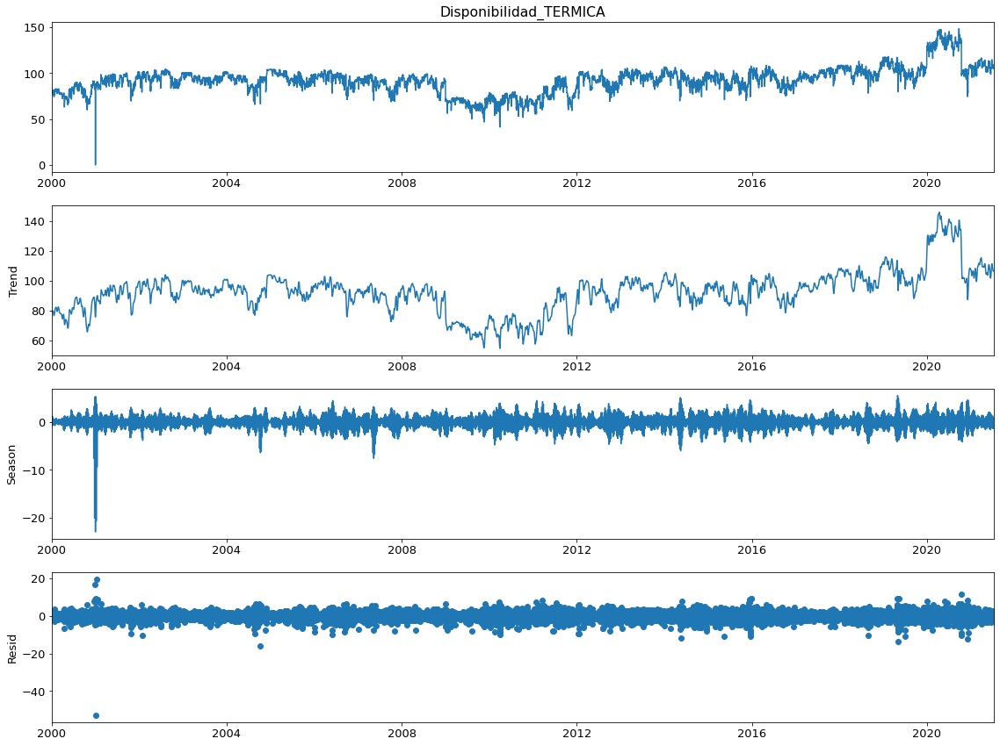

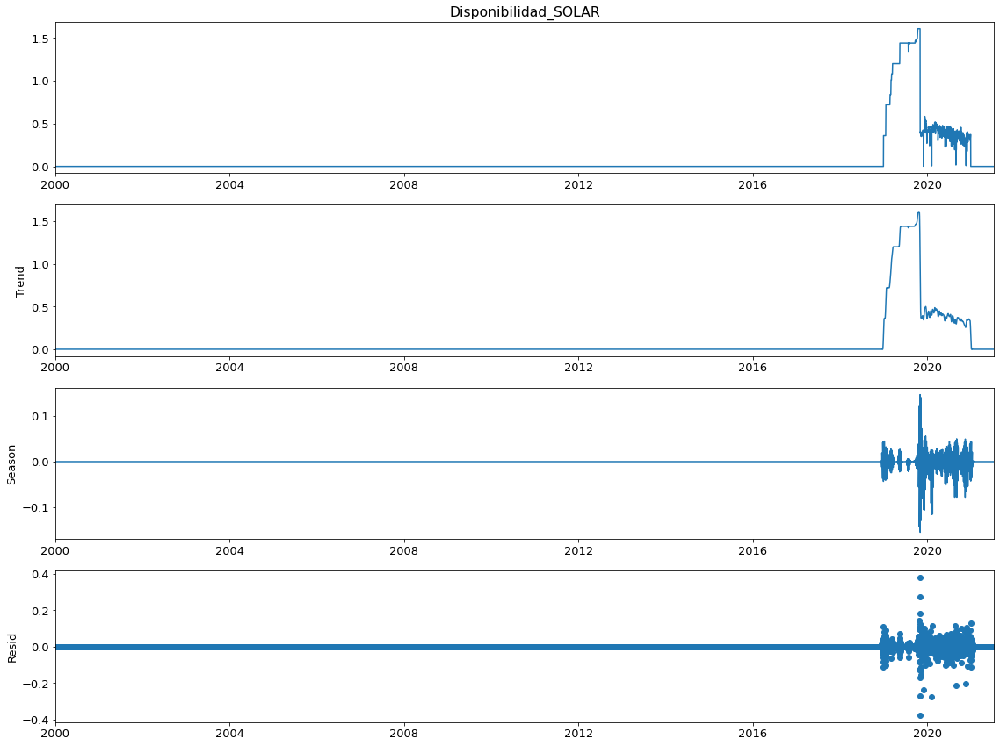

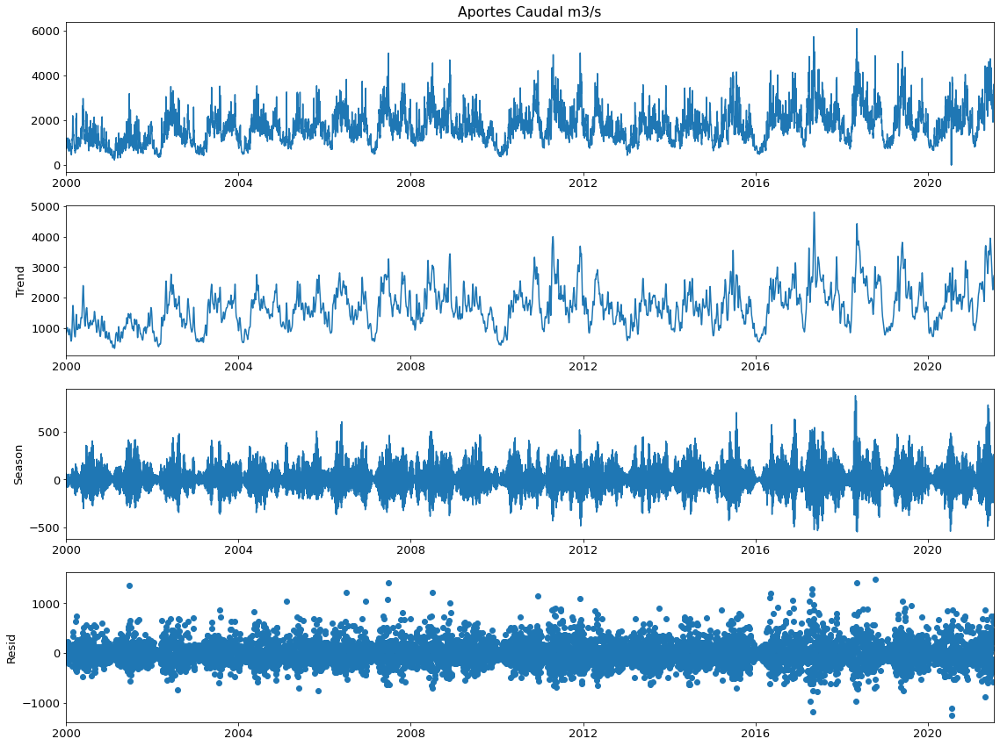

...

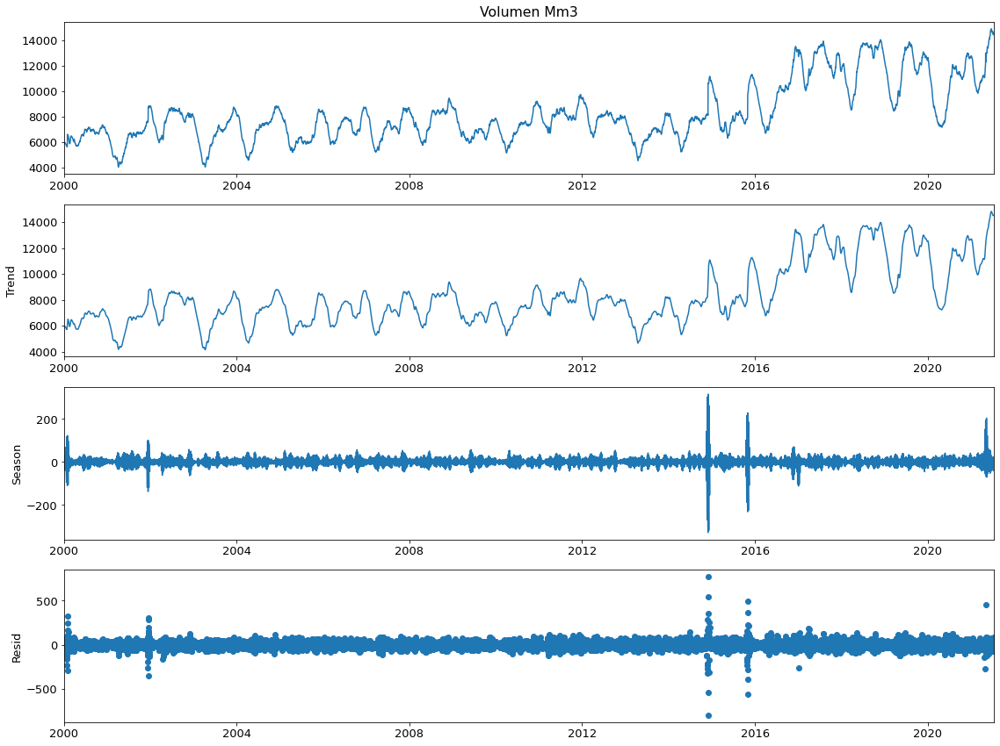

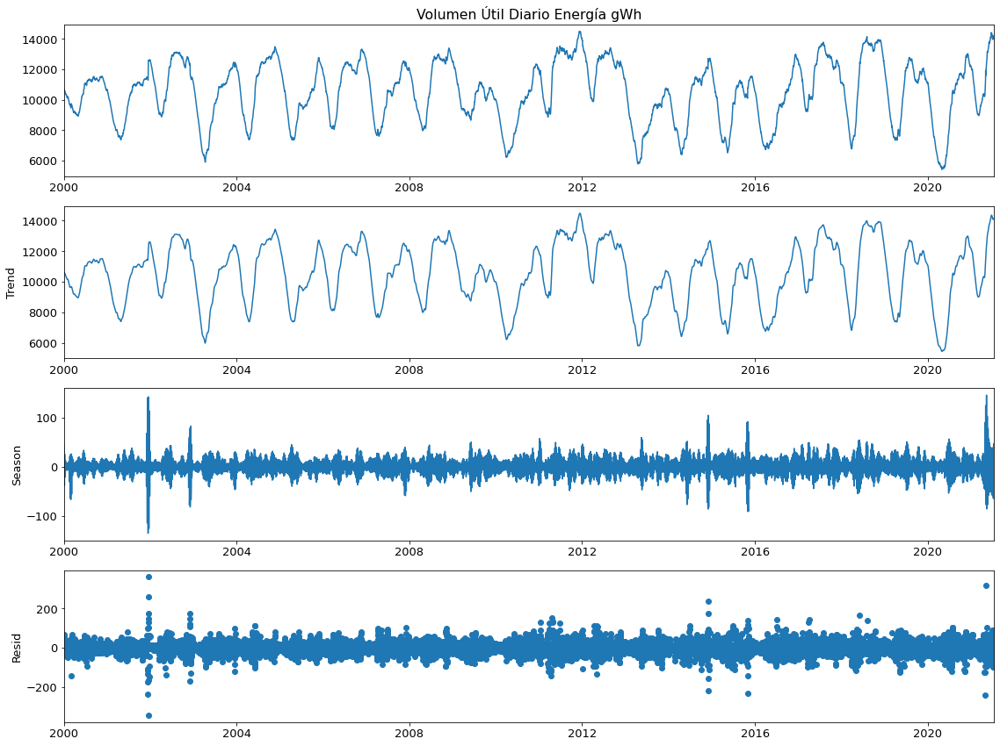

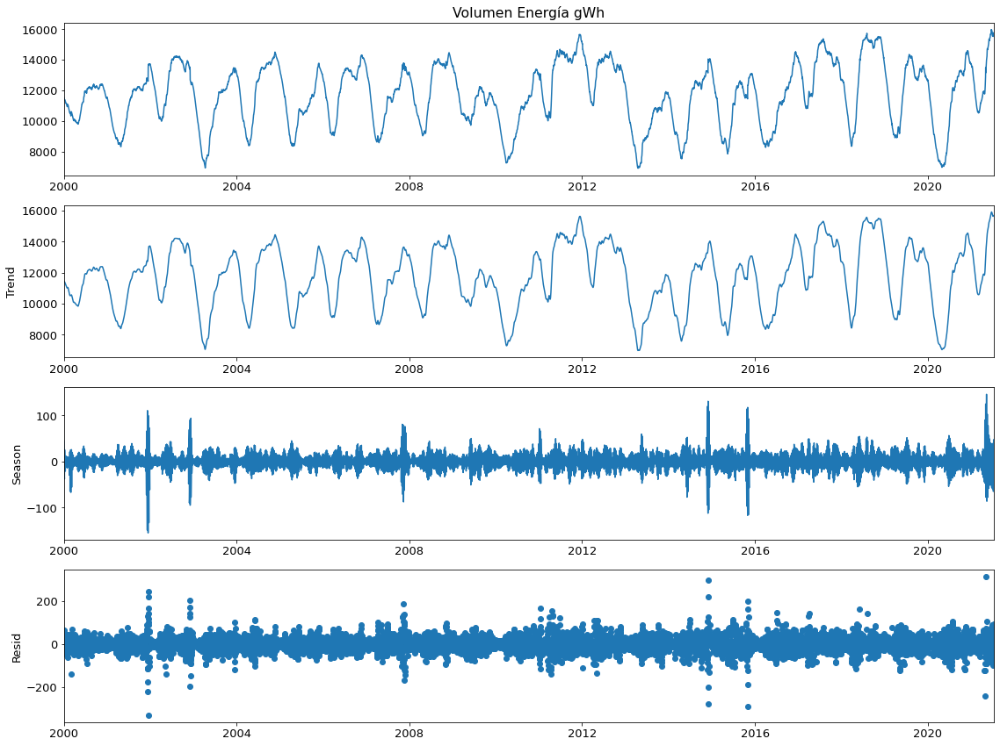

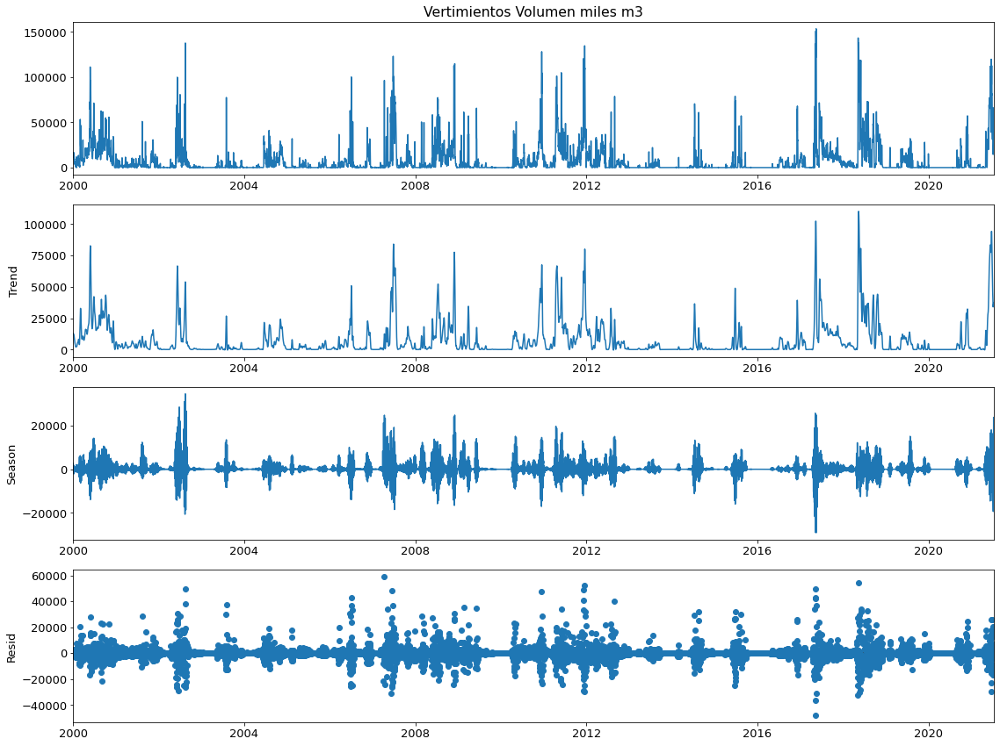

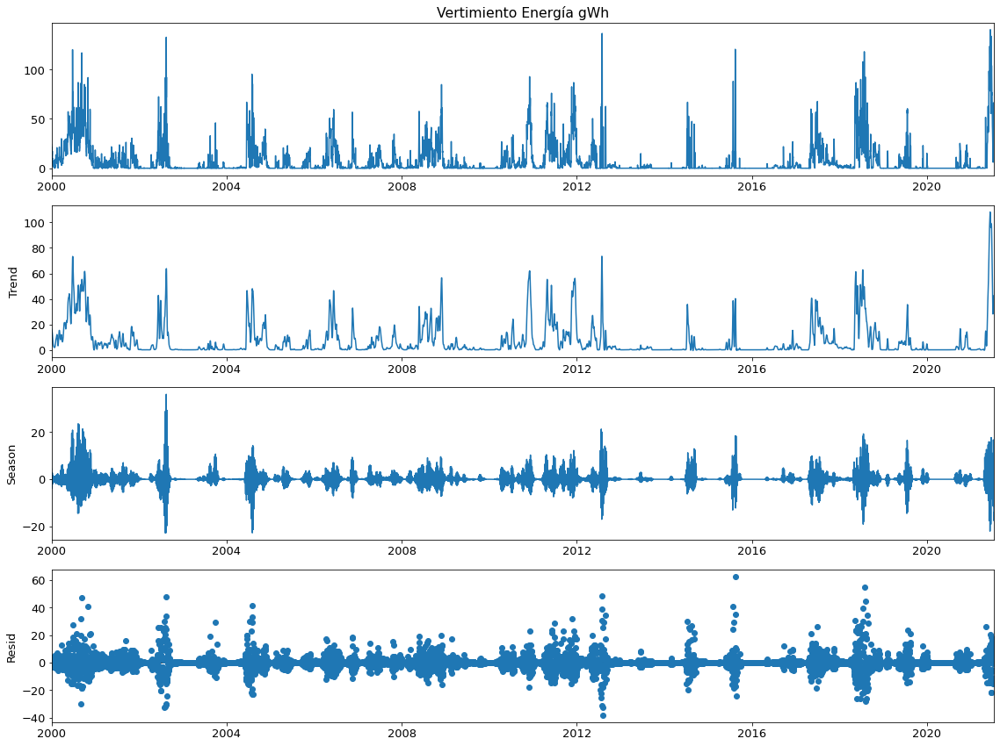

In [47]:
from statsmodels.tsa.seasonal import STL
for i in list_to_plot:
  plt.rc('figure',figsize=(16,12))
  plt.rc('font',size=13)
  Y = df[i].fillna(0)
  stl = STL(Y)
  res = stl.fit()
  fig = res.plot()

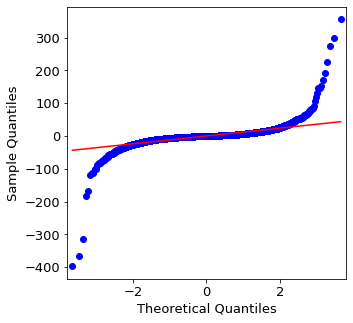

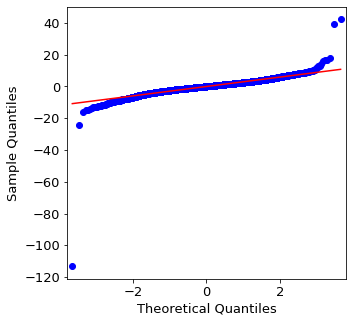

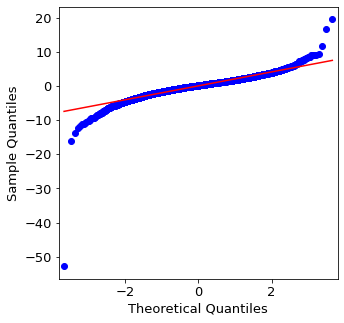

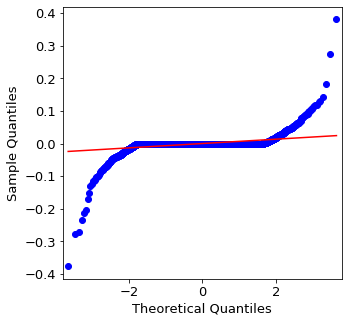

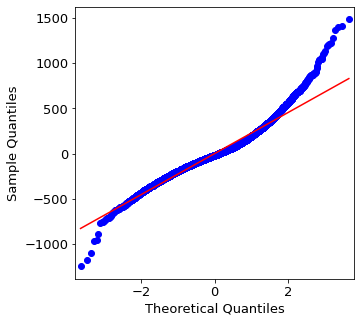

...

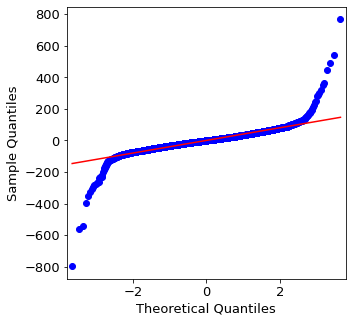

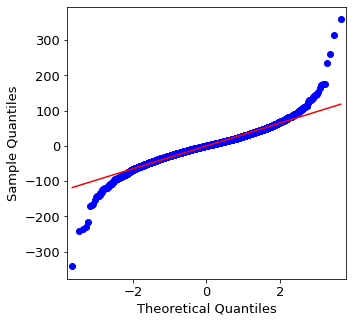

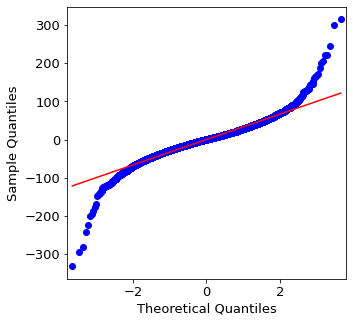

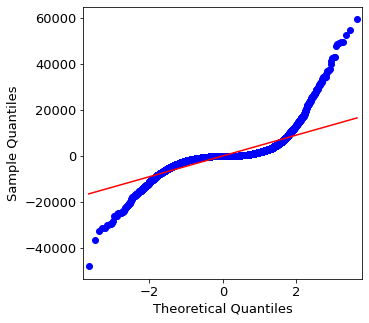

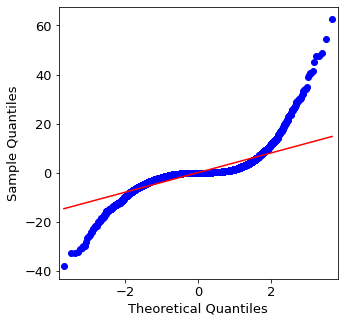

In [96]:
from statsmodels.graphics.gofplots import qqplot
for i in list_to_plot:
  Y = df[i].fillna(0)
  plt.rc('figure',figsize=(5,5), )
  stl = STL(Y)
  res = stl.fit()
  qqplot(res.resid, line='r')
  plt.show()

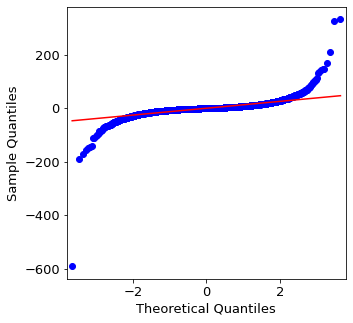

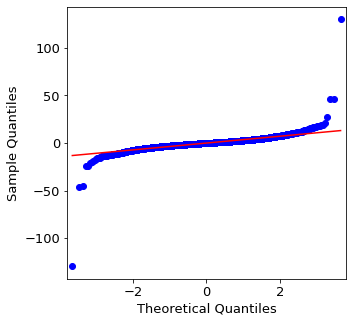

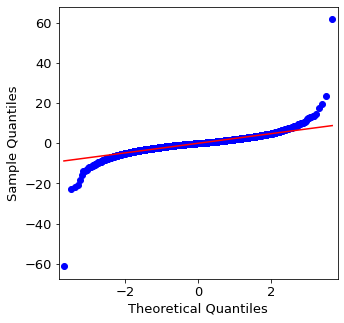

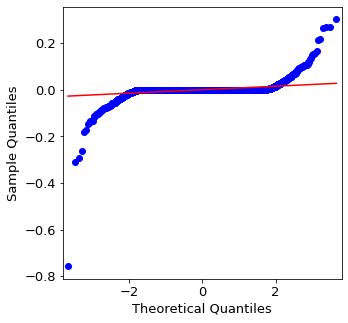

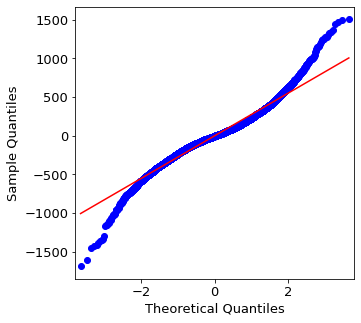

...

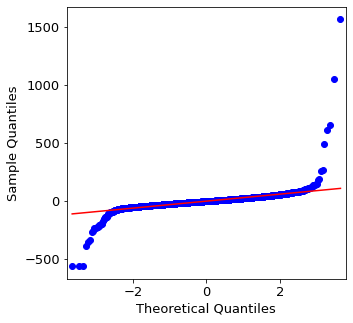

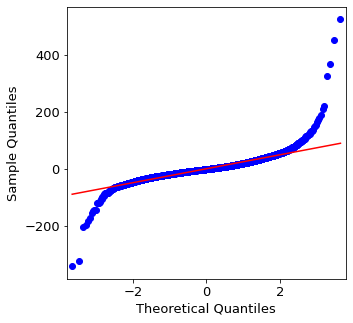

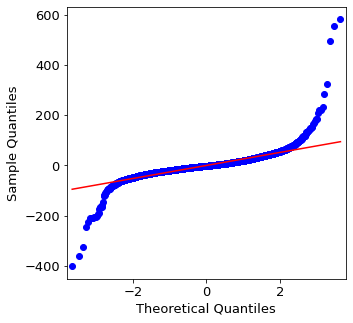

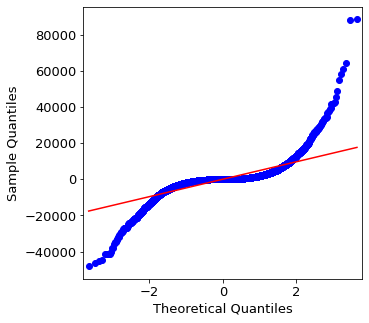

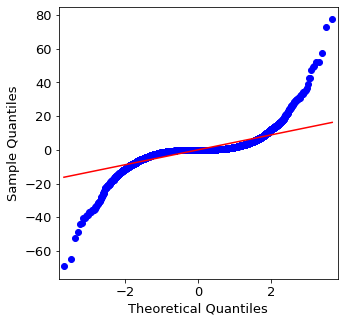

In [97]:
for i in list_to_plot:
  Y = df_diff[i].fillna(0)
  plt.rc('figure',figsize=(5,5), )
  stl = STL(Y)
  res = stl.fit()
  qqplot(res.resid, line='r')
  plt.show()

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/misc.py:411: UserWarning: Requested projection is different from current axis projection, creating new axis with requested projection.
  ax = plt.gca(xlim=(1, n), ylim=(-1.0, 1.0))


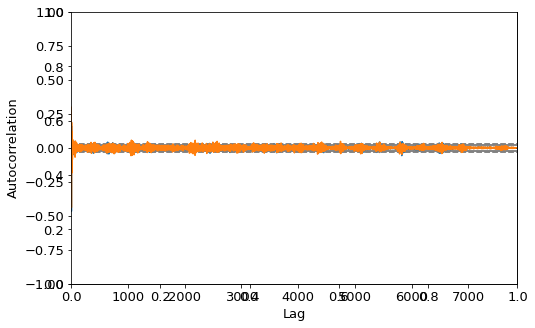

In [91]:
from pandas.plotting import autocorrelation_plot
fig, axs = plt.subplots(figsize=(8,5))
fig1 = autocorrelation_plot(res_diff.resid)
fig2 = autocorrelation_plot(res.resid)
plt.show()